<a href="https://colab.research.google.com/github/G-Gaddu/Quant-Material/blob/main/Mean%20Reversion%20using%20Kalman%20Filtering%20and%20Z%20score.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pykalman

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.4 MB/s eta 0:00:00


In [ ]:
import yfinance as yf
from statsmodels.tsa.stattools import adfuller, coint
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from pykalman import KalmanFilter

In [ ]:
import warnings
warnings.filterwarnings('ignore')


Define the functions

In [ ]:
def find_cointegrated_pairs_with_pvalues(data):
  """
  Iterates through a list of data column headings and returns only the pairs that have a p value less than 0.05 from the cointegration test.
  Returns a list of pairs and their p values.
  """
  n = data.shape[1]
  keys = data.keys()
  pairs_with_pvalues = []
  for i in range(n):
    for j in range(i+1,n):
      S1 = data[keys[i]]
      S2 = data[keys[j]]
      result = coint(S1, S2)
      pvalue = result[1]
      if pvalue < 0.05:
        pairs_with_pvalues.append({
            'pair': (keys[i], keys[j]),
            'pvalue': pvalue
        })
  return pairs_with_pvalues


In [226]:
def calculate_params_with_kalman_filter_dynamic(data, pairs_with_pvalues):
  """
  Calculates the spread between two series using Kalman filter with dynamic parameter estimation.
  """
  spread_dict = {}
  parameters_dict = {}
  for pair_data in pairs_with_pvalues:
    pair = pair_data['pair']
    S1 = data[pair[0]]
    S2 = data[pair[1]]

    obs_mat = sm.add_constant(np.log(S1).values, prepend=False)[:, np.newaxis]
    trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2,
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))

    state_means, state_covs = kf.filter(np.log(S2).values)
    slope=state_means[:, 0]
    intercept=state_means[:, 1]

    # Store the parameters
    parameters_dict[pair] = {
        'slope': slope,
        'intercept': intercept
    }

  return parameters_dict


In [227]:
def calculate_spread_and_zscore(data, parameters_dict):
  """
  Calculates the spread and Z score for each pair.
  """
  spread_dict = {}
  for pair, params in parameters_dict.items():
    S1 = data[pair[0]]
    S2 = data[pair[1]]
    slope = params['slope']
    intercept = params['intercept']

    spread = np.log(S2) - (slope * np.log(S1) + intercept)
    spread_dict[pair] = spread

    # Calculate the Z score with a 10-day rolling window
    spread_dict[pair + ('_zscore',)] = (spread - spread.rolling(window=10).mean()) / spread.rolling(window=10).std()

  return spread_dict


In [228]:
def plot_zscore_with_bounds(spread_dict):
  """
  Plots the Z score for each spread on a graph and shows the mean, lower bound, and upper bound.
  """
  for pair, zscore in spread_dict.items():
    if '_zscore' in pair:
      plt.figure(figsize=(12, 6))
      plt.plot(zscore, label='Z-Score')

      # Calculate mean, lower bound, and upper bound
      mean = zscore.mean()
      std = zscore.std()
      lower_bound = mean - 1.96 * std
      upper_bound = mean + 1.96 * std

      plt.axhline(y=mean, color='r', linestyle='--', label='Mean')
      plt.axhline(y=lower_bound, color='g', linestyle='--', label='Lower Bound')
      plt.axhline(y=upper_bound, color='g', linestyle='--', label='Upper Bound')

      plt.title(f'Z-Score for {pair[0]} and {pair[1]}')
      plt.xlabel('Date')
      plt.ylabel('Z-Score')
      plt.legend()
      plt.show()


In [229]:
def backtest_zscore_strategy(data, spread_dict, parameters_dict, initial_capital=100000):
  """
  Backtests the Z-score strategy using the spread and Z-score data.
  """
  returns = {}
  for pair, zscore in spread_dict.items():
    if '_zscore' in pair:
      # Extract the pair name
      pair_name = (pair[0], pair[1])

      # Get the slope and intercept for the pair
      slope = parameters_dict[pair_name]['slope']
      intercept = parameters_dict[pair_name]['intercept']

      # Initialize variables
      capital = initial_capital
      stock1_units = 0
      stock2_units = 0
      portfolio_value = initial_capital
      transactions = []
      returns_over_time = []  # Store returns over time

      # Calculate mean and standard deviation
      mean = zscore.mean()
      std = zscore.std()
      lower_bound = mean - 1.96 * std
      upper_bound = mean + 1.96 * std

      # Iterate over the Z-score data
      for i in range(len(zscore)):
        if zscore[i] > upper_bound:
          # Sell 100 unit of stock 1
          if stock1_units > 0:
            price_stock1 = data[pair_name[0]][i]*100
            capital += price_stock1 * 100
            stock1_units -= 100
            transactions.append(f"Sell 100 unit of {pair_name[0]} at {price_stock1}")

          # Buy b*100 units of stock 2
          b = slope[i]  # Get the slope (b) from the Kalman filter output
          price_stock2 = data[pair_name[1]][i]
          cost = price_stock2 * b*100
          if capital >= cost:
            stock2_units += b*100
            capital -= cost
            transactions.append(f"Buy {b*100} units of {pair_name[1]} at {price_stock2}")

        elif zscore[i] < lower_bound:
          # Buy 1 unit of stock 100
          price_stock1 = data[pair_name[0]][i]
          cost = price_stock1 * 100
          if capital >= cost:
            stock1_units += 100
            capital -= cost
            transactions.append(f"Buy 100 unit of {pair_name[0]} at {price_stock1}")

          # Sell b*100 units of stock 2
          b = slope[i]
          if stock2_units > 0:
            price_stock2 = data[pair_name[1]][i]
            capital += price_stock2 * b * 100
            stock2_units -= b*100
            transactions.append(f"Sell {b*100} units of {pair_name[1]} at {price_stock2}")

        elif zscore[i] == 0:
          # Close positions
          if stock1_units > 0:
            price_stock1 = data[pair_name[0]][i]
            capital += price_stock1 * stock1_units
            stock1_units = 0
            transactions.append(f"Sell {stock1_units} units of {pair_name[0]} at {price_stock1}")
          if stock2_units > 0:
            price_stock2 = data[pair_name[1]][i]
            capital += price_stock2 * stock2_units
            stock2_units = 0
            transactions.append(f"Sell {stock2_units} units of {pair_name[1]} at {price_stock2}")

        # Calculate portfolio value
        current_value_stock1 = stock1_units * data[pair_name[0]][i] if stock1_units > 0 else 0
        current_value_stock2 = stock2_units * data[pair_name[1]][i] if stock2_units > 0 else 0
        portfolio_value = capital + current_value_stock1 + current_value_stock2

        # Store the return for this time step
        returns_over_time.append((portfolio_value - initial_capital) / initial_capital * 100)

      # Calculate total return
      total_return = (portfolio_value - initial_capital) / initial_capital * 100

      # Store the results
      returns[pair_name] = {
          'total_return': total_return,
          'final_portfolio_value': portfolio_value,
          'transactions': transactions,
          'returns_over_time': returns_over_time  # Add returns_over_time to the dictionary
      }
  return returns



In [ ]:
def performance_metrics(results):
  # Create an empty list to store the results
  performance_data = []

  # Iterate over the results dictionary
  for pair, result in results.items():
    total_return = result['total_return']
    num_trades = len(result['transactions'])
    returns_over_time = result['returns_over_time']

    # Calculate annualized return
    # Assuming 252 trading days in a year
    annualized_return = (1 + total_return / 100) ** (252 / len(energy_data)) - 1
    annualized_return *= 100  # Convert to percentage

    # Calculate Sharpe Ratio (simplified, assuming risk-free rate = 0.01)
    if np.std(returns_over_time) != 0:
      sharpe_ratio = ((annualized_return - 0.01) / (np.std(returns_over_time) * np.sqrt(252))) * 100
    else:
      sharpe_ratio = 0  # Avoid division by zero

    # Append the results to the list
    performance_data.append([pair[0], pair[1], total_return, annualized_return, sharpe_ratio, num_trades])

  # Create a pandas DataFrame from the results
  df_results = pd.DataFrame(performance_data, columns=['Stock 1', 'Stock 2', 'Total % Return', 'Annualized % Return', 'Sharpe Ratio', 'Number of Trades'])

  # Display the DataFrame
  return df_results


Energy Stocks

In [ ]:
# We look at Australian energy companies with a market cap between $1B and $10B
energy_tickers = ["YAL.AX", "ALD.AX", "WHC.AX", "VEA.AX", "NHC.AX", "BPT.AX", "PDN.AX", "KAR.AX", "BOE.AX"]

In [ ]:
# Download the data
energy_data = yf.download(energy_tickers, period="10y")['Adj Close']
energy_data.head()

[*********************100%***********************]  9 of 9 completed


Ticker,ALD.AX,BOE.AX,BPT.AX,KAR.AX,NHC.AX,PDN.AX,VEA.AX,WHC.AX,YAL.AX
Date,,,,,,,,,
2014-09-11 00:00:00+00:00,19.824183,0.146938,1.263232,3.423280,1.737008,3.720854,NaN,1.298059,3.739826
2014-09-12 00:00:00+00:00,19.893019,0.146938,1.259090,3.325725,1.707265,3.677080,NaN,1.287757,3.615166
2014-09-15 00:00:00+00:00,19.397417,0.139591,1.221815,3.316857,1.665624,3.458206,NaN,1.253417,3.615166
2014-09-16 00:00:00+00:00,19.480019,0.161632,1.238382,3.325725,1.665624,3.283107,NaN,1.249983,3.490504
2014-09-17 00:00:00+00:00,19.493782,0.161632,1.234240,3.361199,1.665624,3.501981,NaN,1.219077,3.490504


In [ ]:
# Count the NaNs in each column
print(energy_data.isna().sum())


Ticker
ALD.AX      0
BOE.AX      0
BPT.AX      0
KAR.AX      0
NHC.AX      0
PDN.AX      0
VEA.AX    971
WHC.AX      0
YAL.AX      0
dtype: int64


In [ ]:
# Drop the VEA.AX column
energy_data = energy_data.drop('VEA.AX', axis=1)


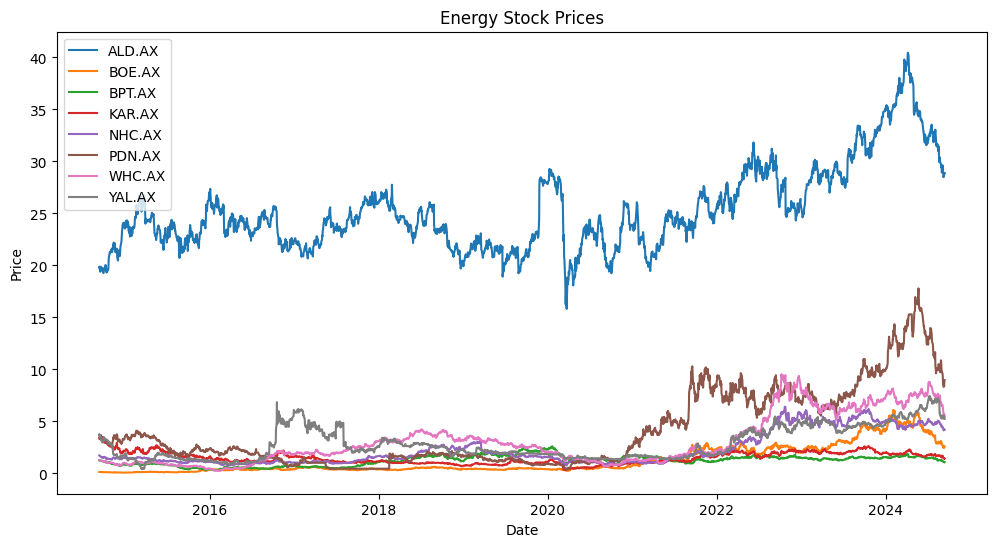

In [ ]:
# Plot the prices over time
plt.figure(figsize=(12, 6))
for column in energy_data.columns:
  plt.plot(energy_data[column], label=column)
plt.title('Energy Stock Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [ ]:
# Find the cointegrated pairs
energy_sig = find_cointegrated_pairs_with_pvalues(energy_data)
energy_sig

[{'pair': ('ALD.AX', 'BOE.AX'), 'pvalue': 2.5827681306155388e-05},
 {'pair': ('ALD.AX', 'KAR.AX'), 'pvalue': 0.023603675663670134},
 {'pair': ('ALD.AX', 'NHC.AX'), 'pvalue': 0.008223052071773802},
 {'pair': ('ALD.AX', 'PDN.AX'), 'pvalue': 0.0008541251975366428},
 {'pair': ('ALD.AX', 'WHC.AX'), 'pvalue': 0.018668246147381704},
 {'pair': ('ALD.AX', 'YAL.AX'), 'pvalue': 0.010013093050390784},
 {'pair': ('KAR.AX', 'NHC.AX'), 'pvalue': 0.0033739827677707044},
 {'pair': ('KAR.AX', 'PDN.AX'), 'pvalue': 0.002619998312410575},
 {'pair': ('KAR.AX', 'WHC.AX'), 'pvalue': 0.021234595091109292}]

In [ ]:
# Get the pairs
energy_pairs = [pair['pair'] for pair in energy_sig]
print(energy_pairs)


[('ALD.AX', 'BOE.AX'), ('ALD.AX', 'KAR.AX'), ('ALD.AX', 'NHC.AX'), ('ALD.AX', 'PDN.AX'), ('ALD.AX', 'WHC.AX'), ('ALD.AX', 'YAL.AX'), ('KAR.AX', 'NHC.AX'), ('KAR.AX', 'PDN.AX'), ('KAR.AX', 'WHC.AX')]


In [ ]:
# Calculate the regression parameters using Kalman filtering for each spread over time
energy_params = calculate_params_with_kalman_filter_dynamic(energy_data, energy_sig)

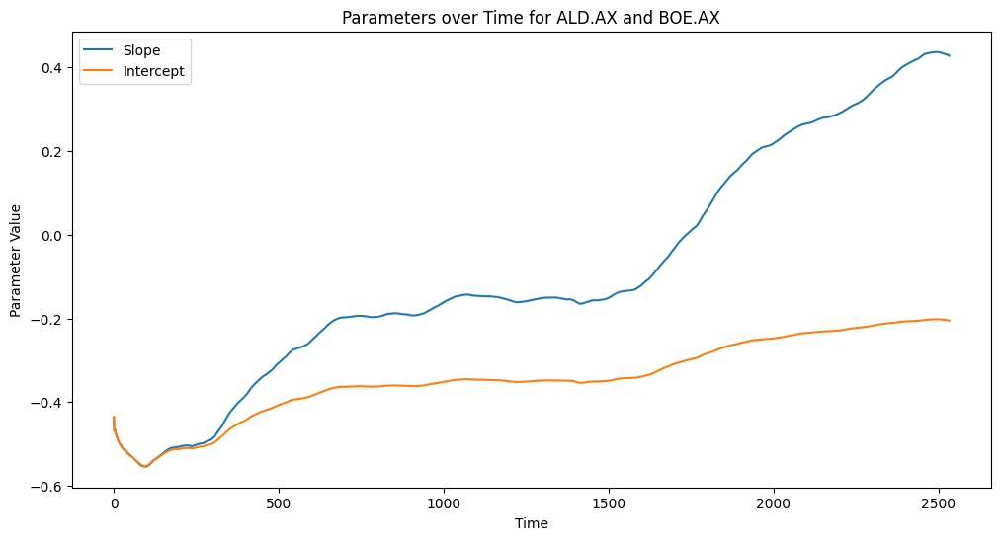

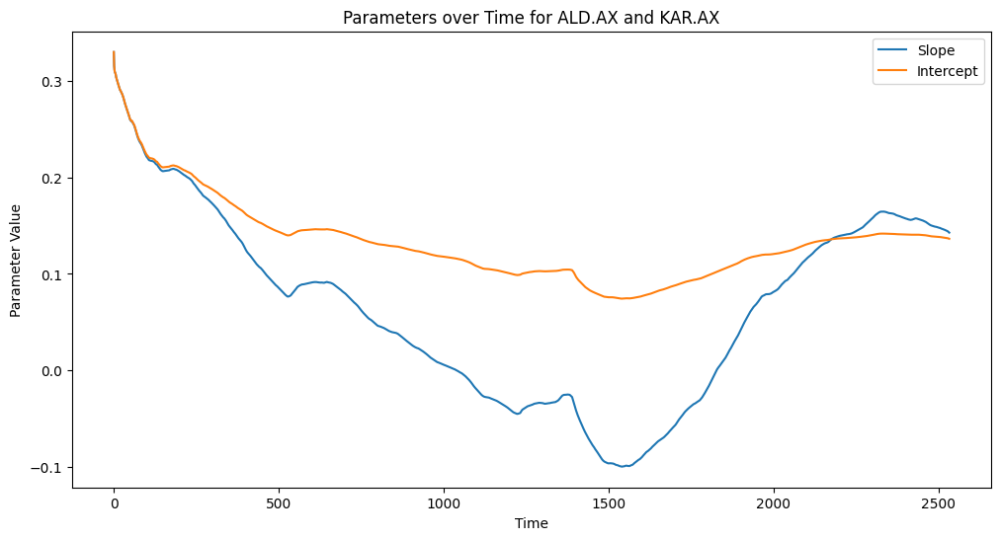

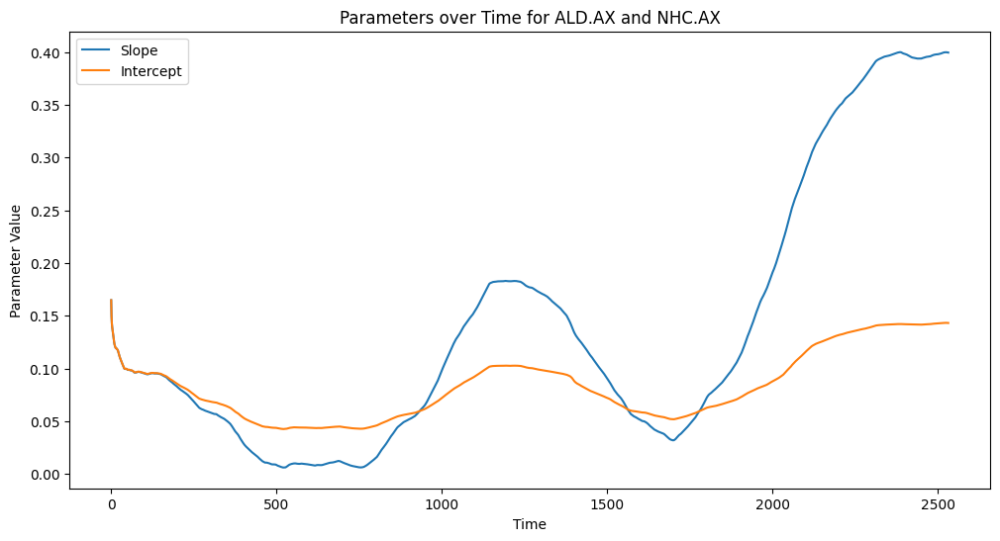

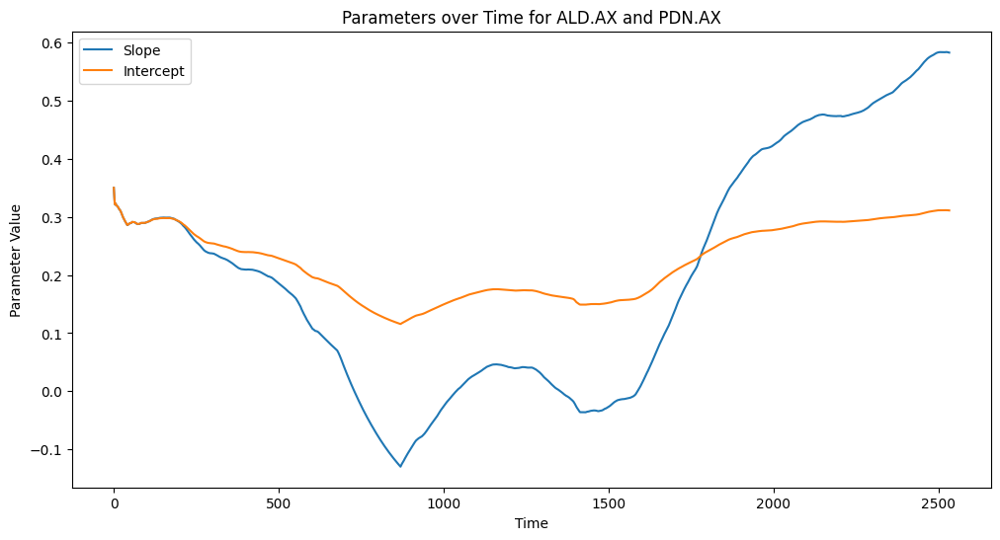

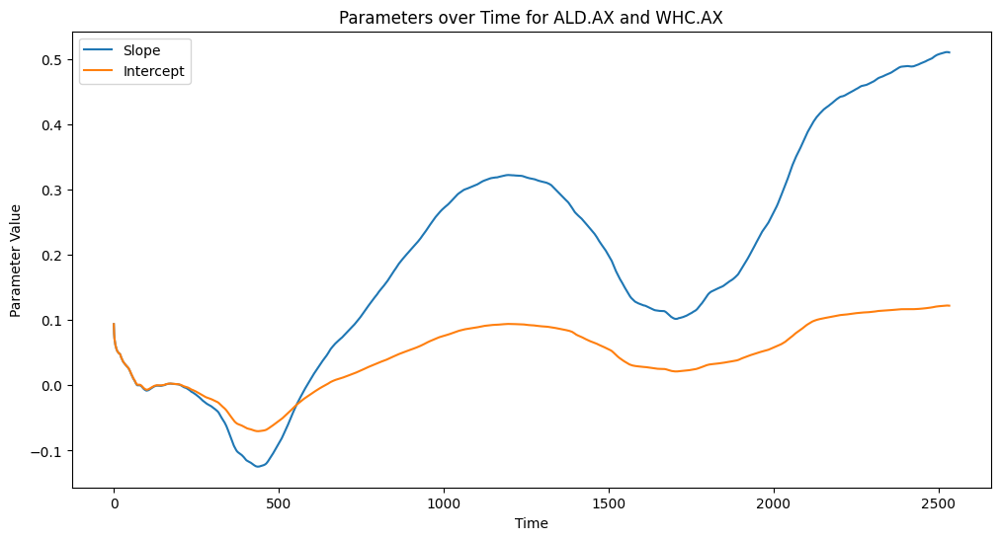

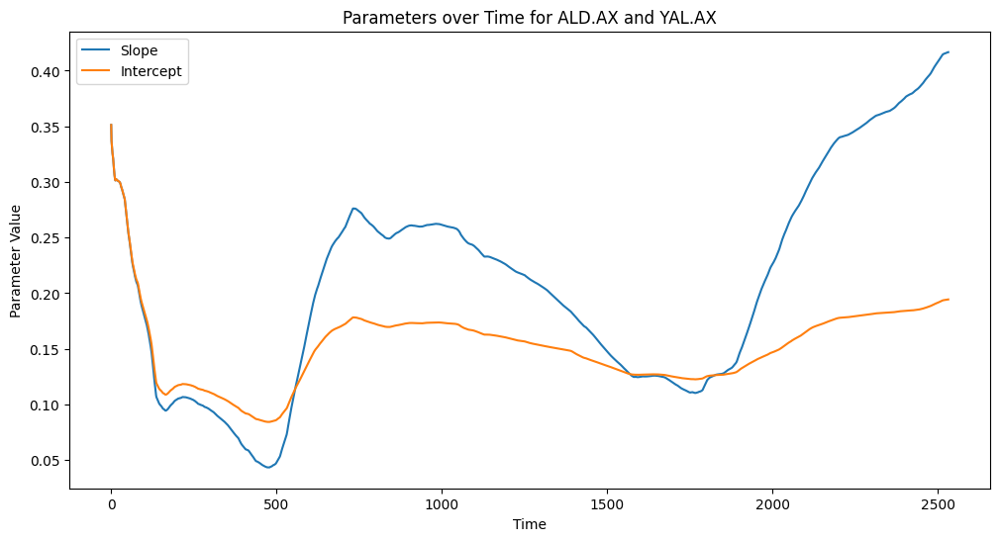

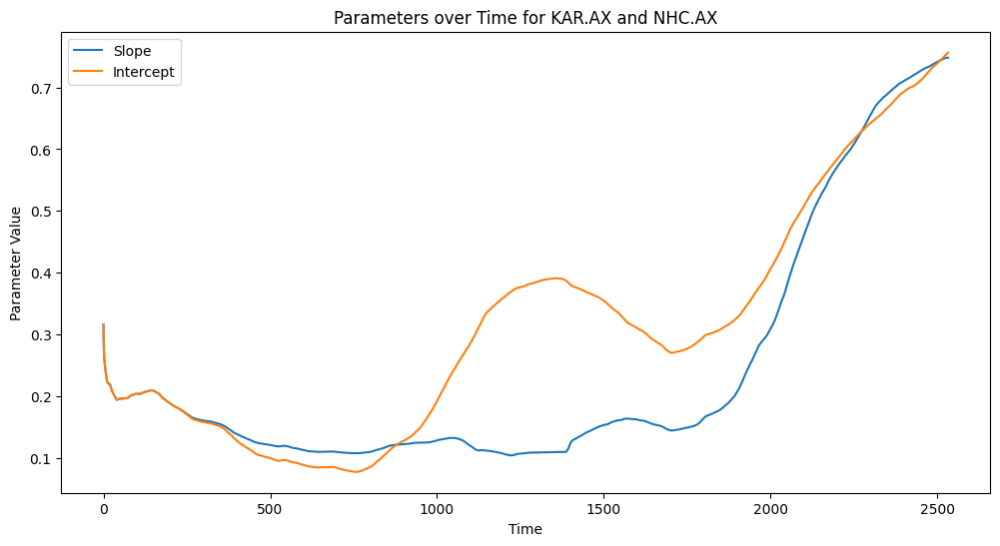

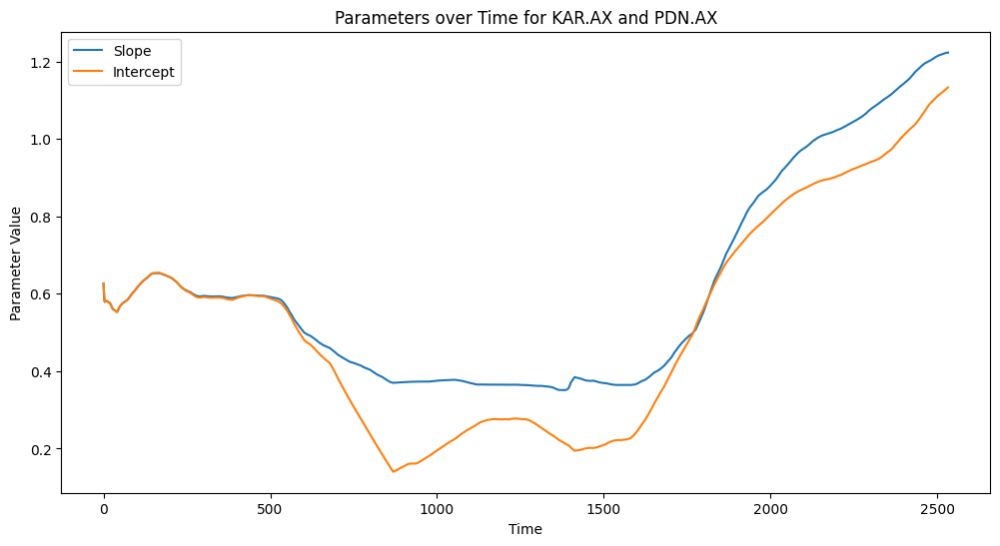

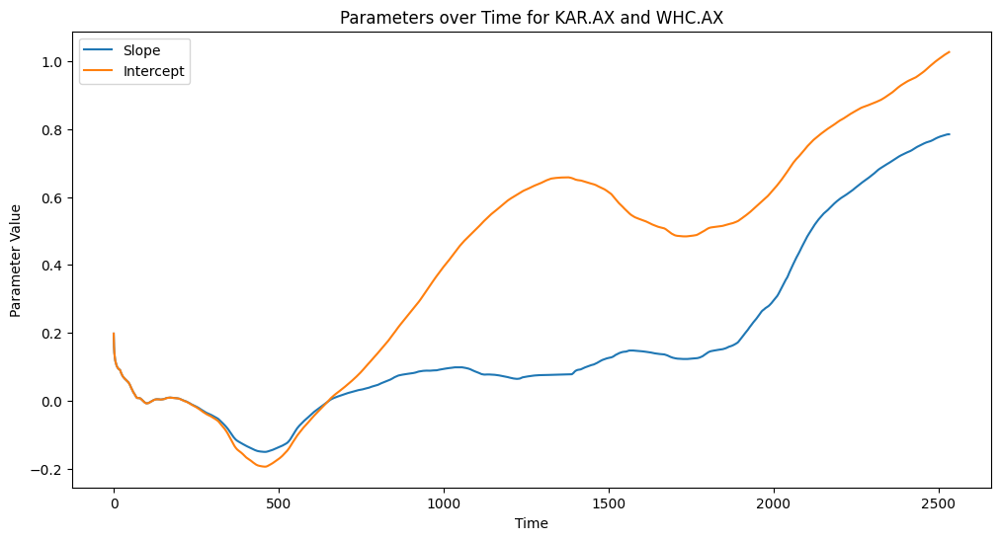

In [ ]:
# Plot the parameters over time for each pair
for pair, params in energy_params.items():
  slope = params['slope']
  intercept = params['intercept']

  plt.figure(figsize=(12, 6))
  plt.plot(slope, label='Slope')
  plt.plot(intercept, label='Intercept')

  plt.title(f'Parameters over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Parameter Value')
  plt.legend()
  plt.show()


In [ ]:
energy_spreads = calculate_spread_and_zscore(energy_data, energy_params)

In [ ]:
# Drop NaNs in the energy spreads
for pair, spread in energy_spreads.items():
  if '_zscore' in pair:
    energy_spreads[pair] = spread.dropna()


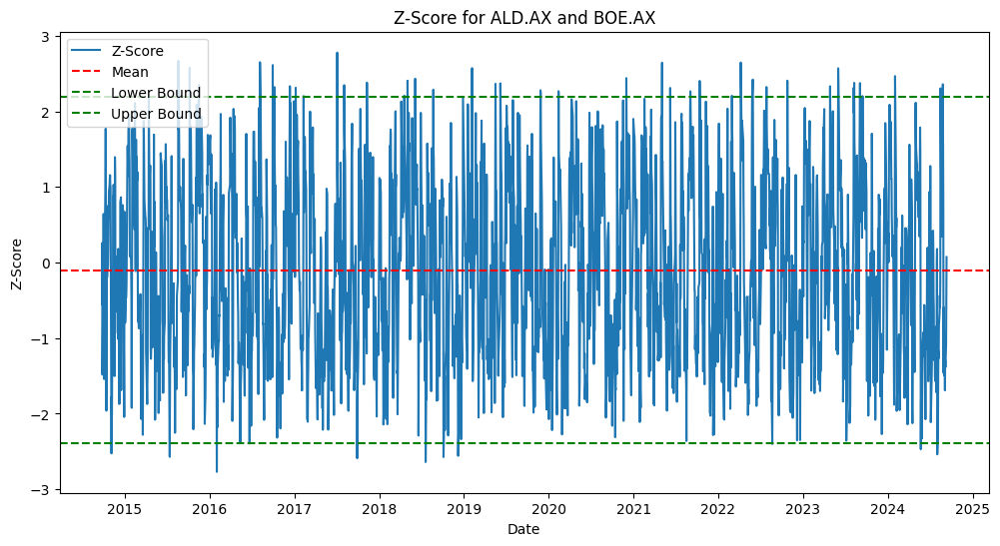

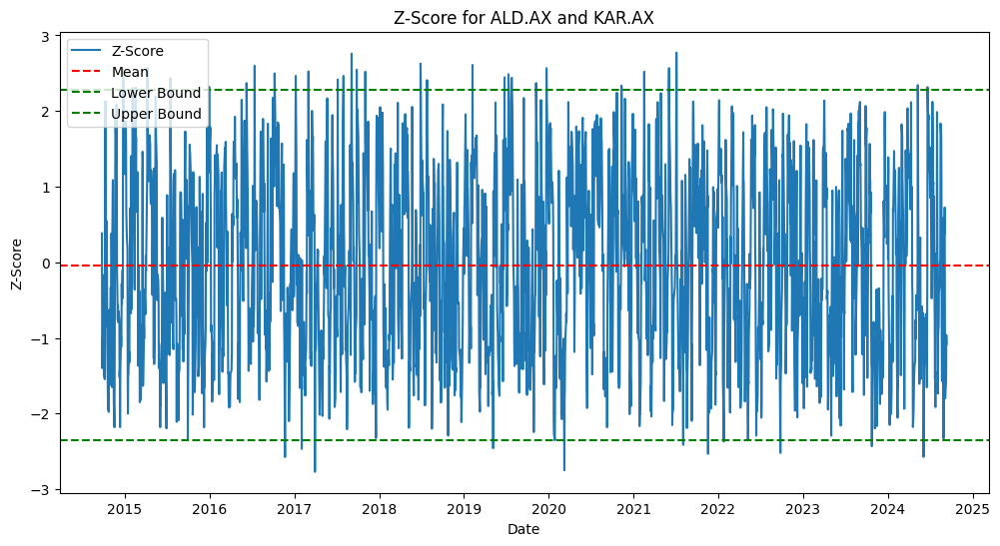

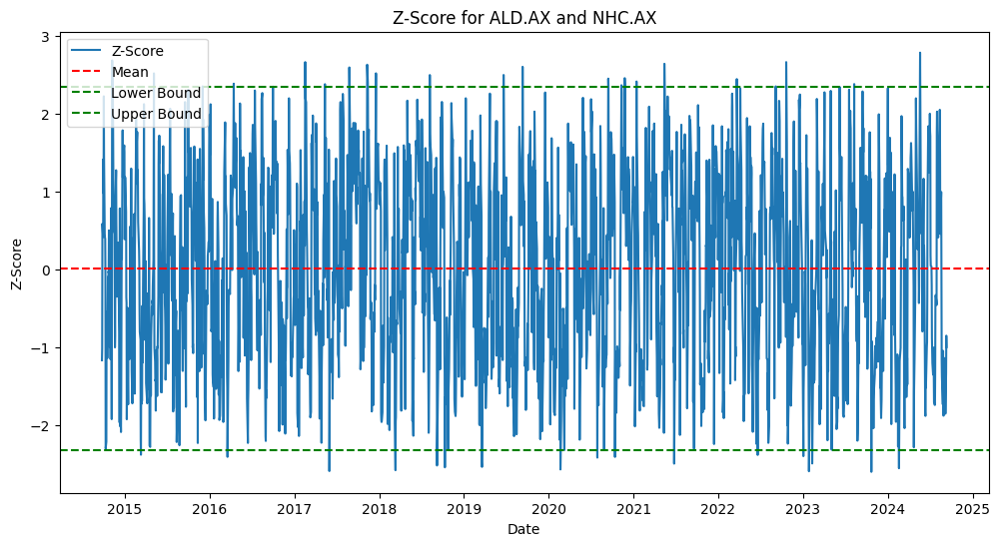

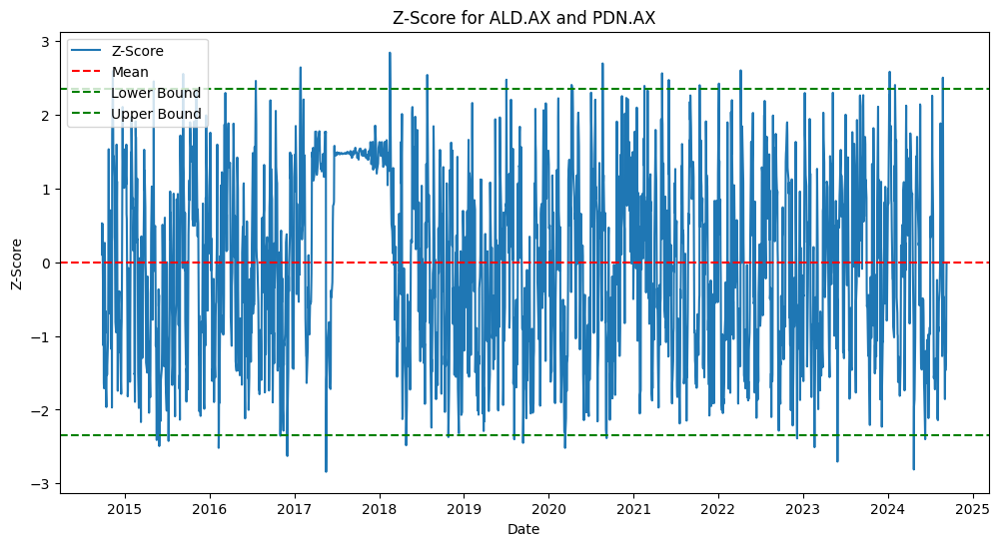

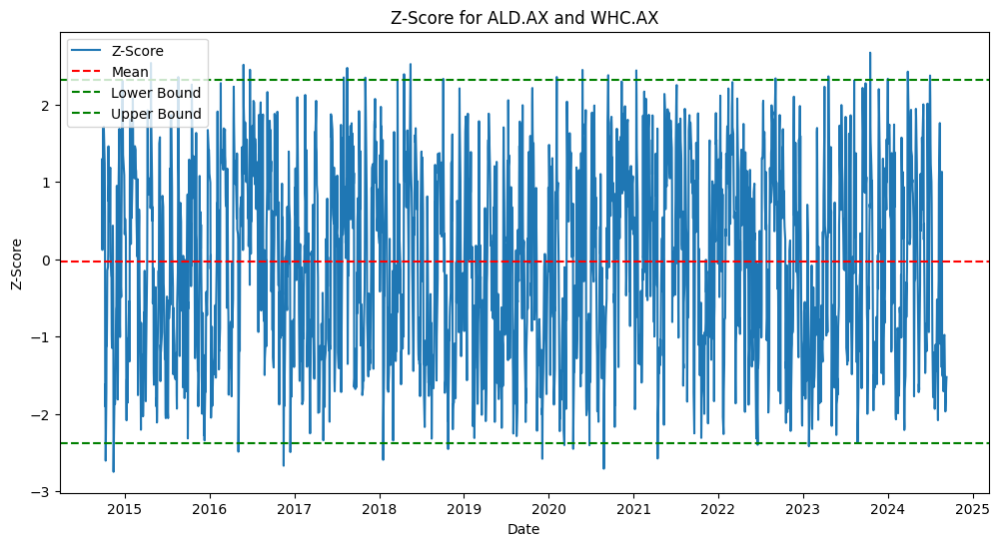

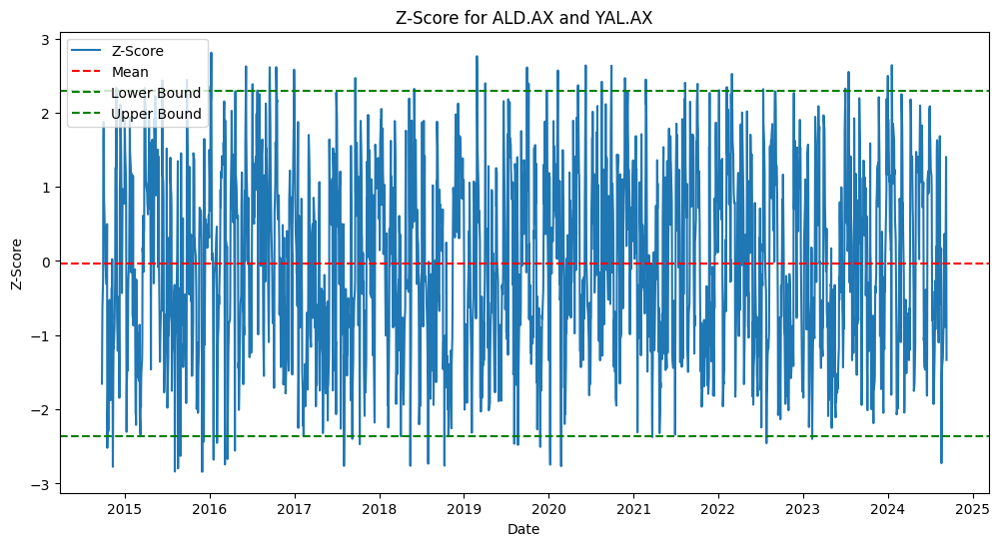

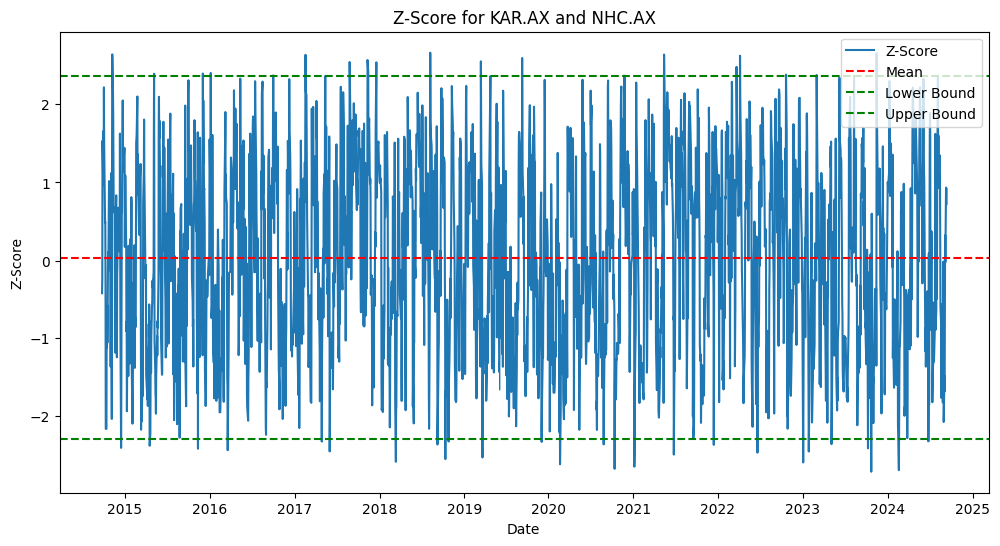

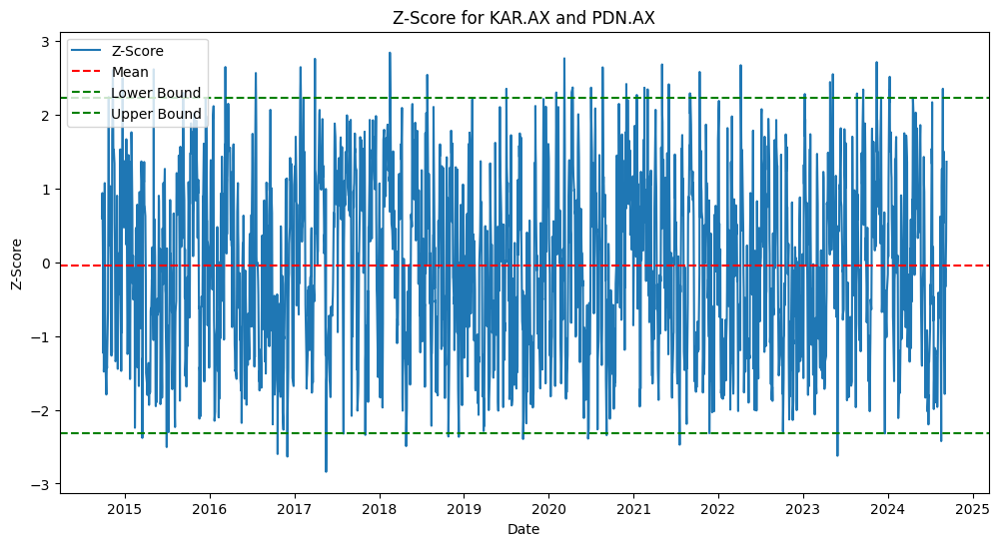

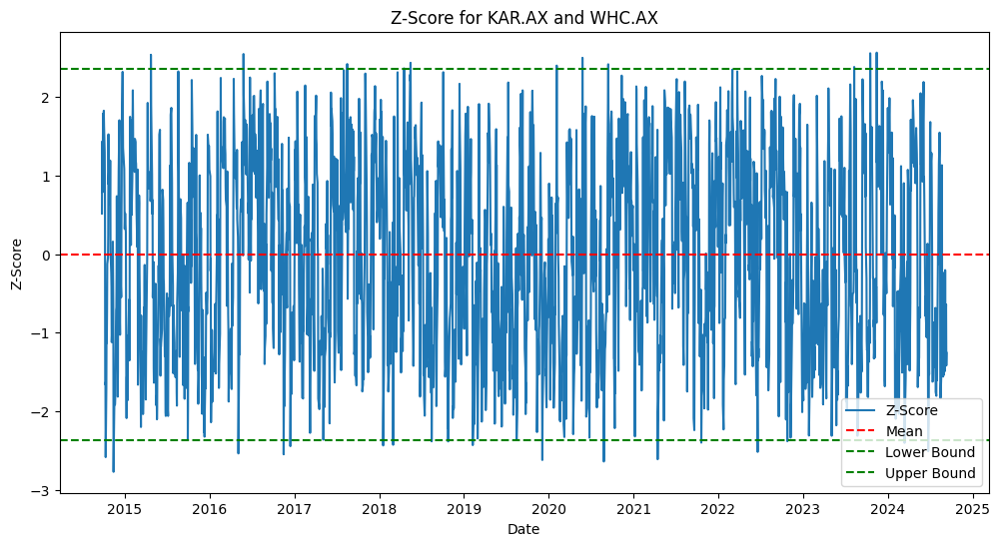

In [232]:
plot_zscore_with_bounds(energy_spreads)

In [ ]:
energy_results = backtest_zscore_strategy(energy_data, energy_spreads, energy_params)

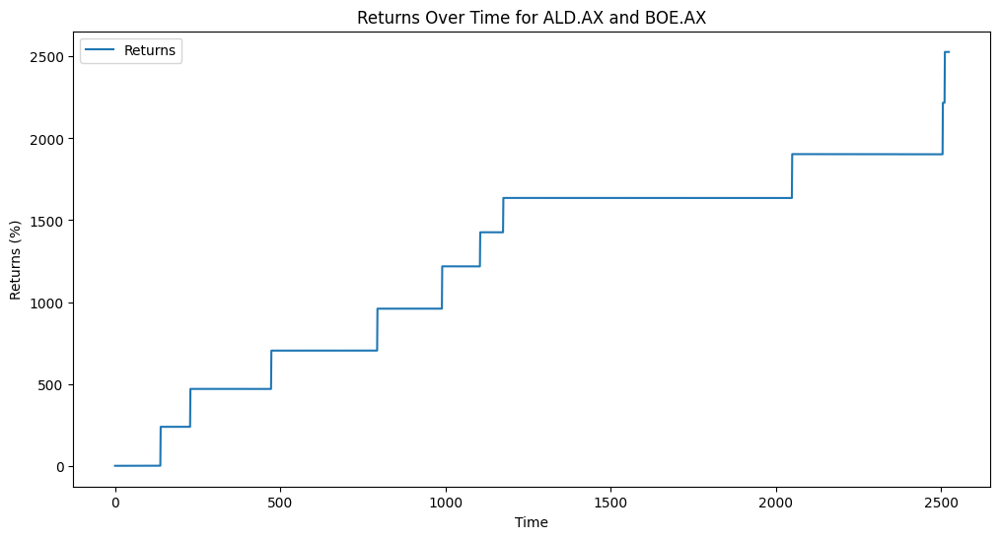

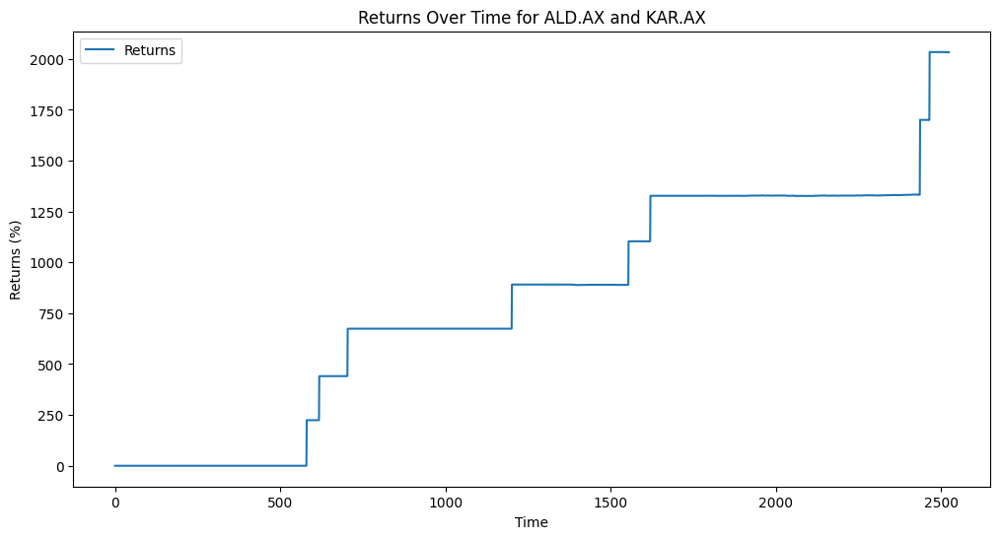

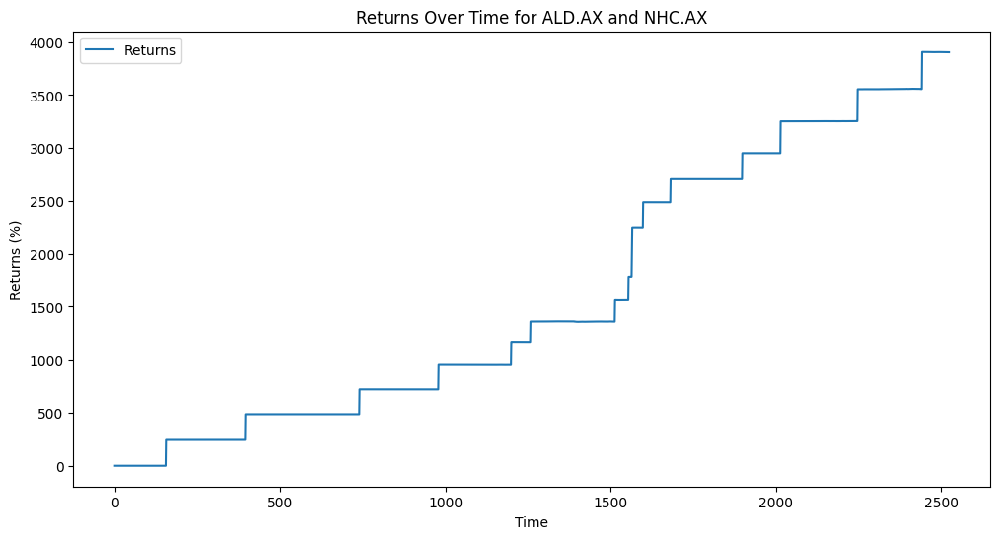

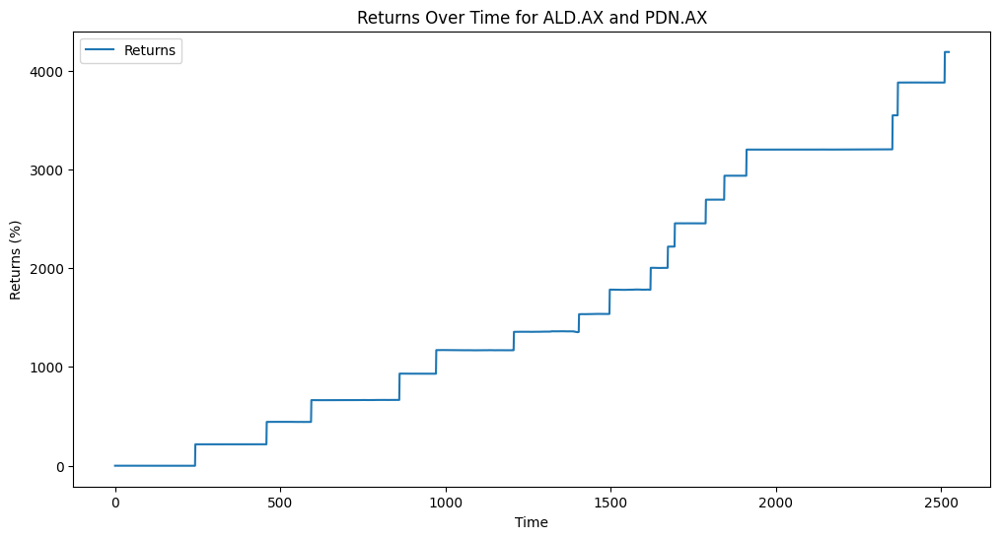

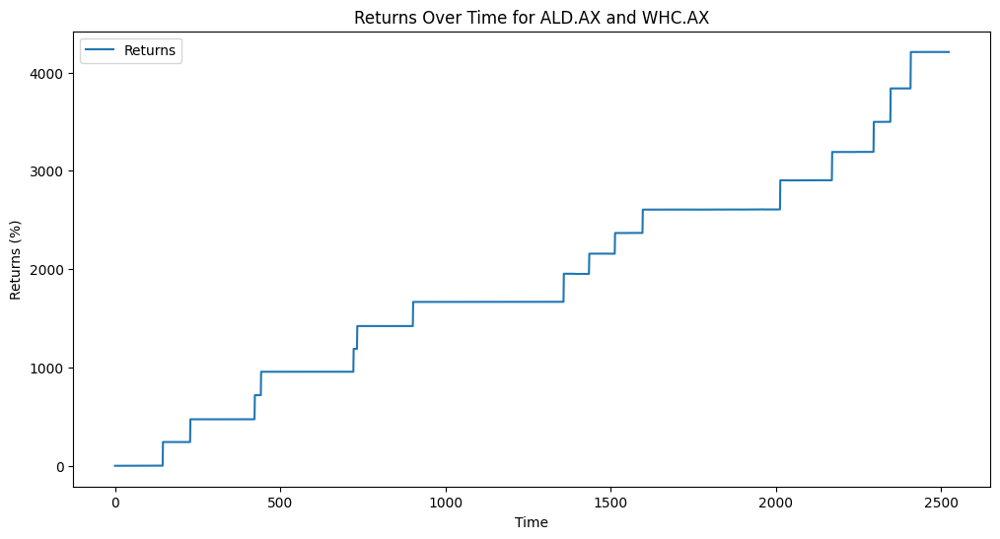

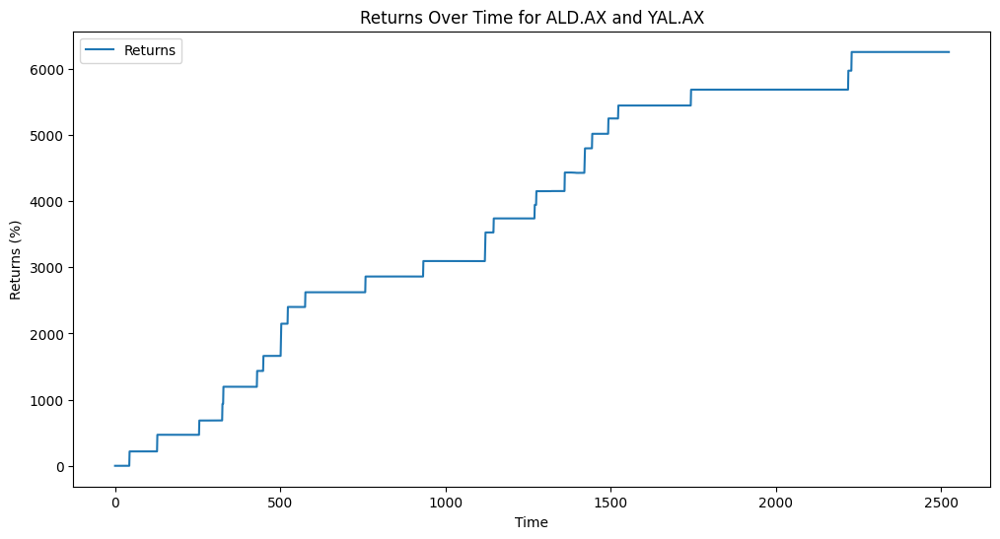

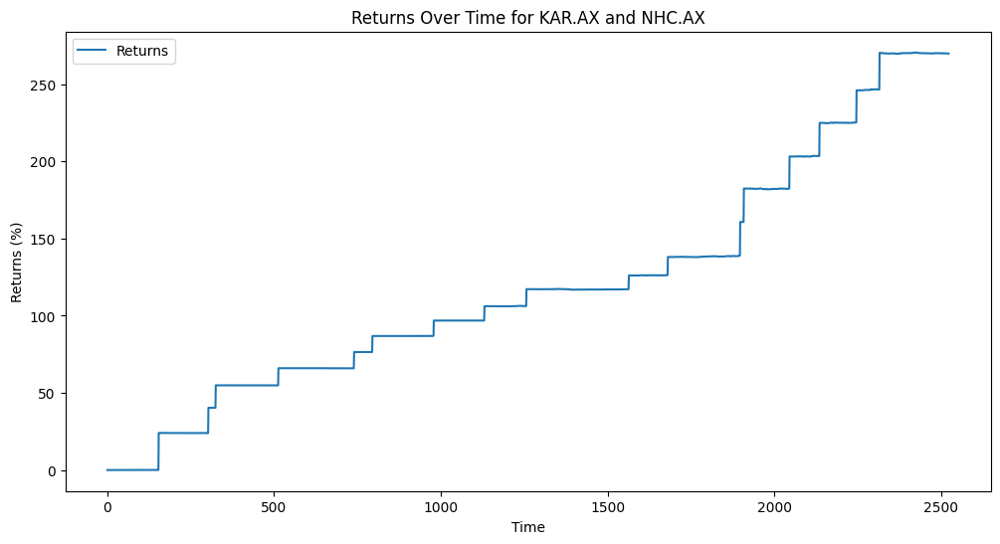

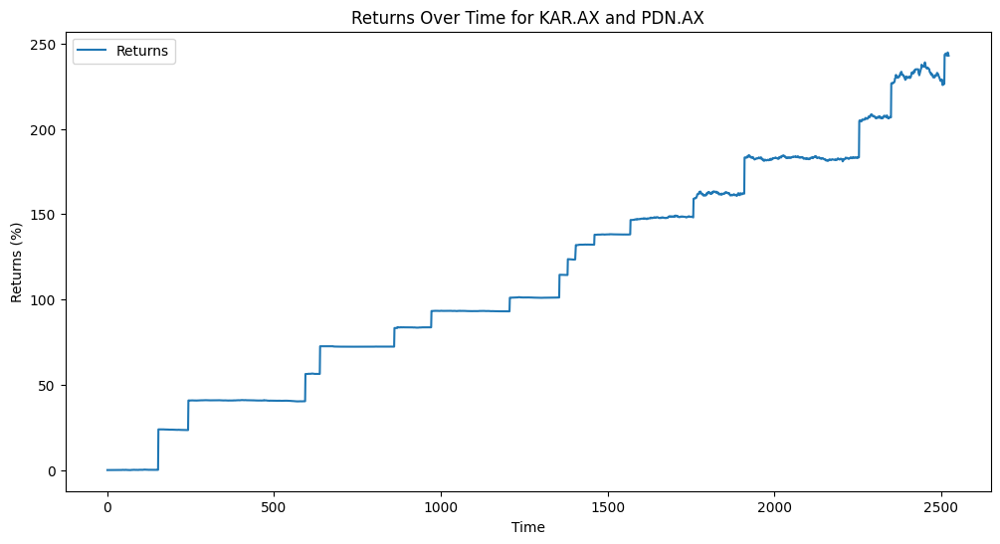

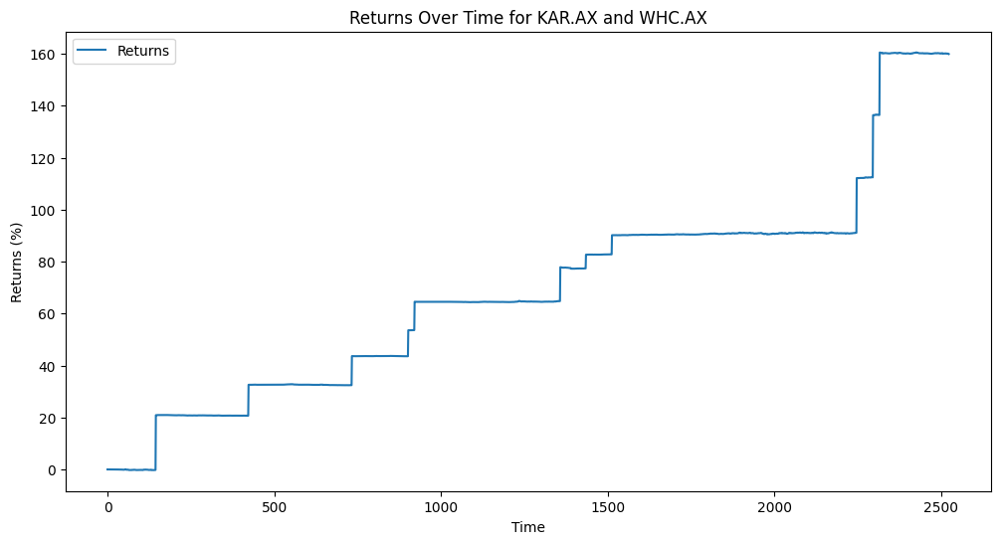

In [ ]:
# Plot the returns over time for each pair
for pair, result in energy_results.items():
  returns_over_time = result['returns_over_time']
  plt.figure(figsize=(12, 6))
  plt.plot(returns_over_time, label='Returns')
  plt.title(f'Returns Over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Returns (%)')
  plt.legend()
  plt.show()


In [ ]:
performance_metrics(energy_results)

,Stock 1,Stock 2,Total % Return,Annualized % Return,Sharpe Ratio,Number of Trades
0,ALD.AX,BOE.AX,2527.718017,38.429711,0.400210,64
1,ALD.AX,KAR.AX,2032.495103,35.583483,0.410351,66
2,ALD.AX,NHC.AX,3904.075207,44.353653,0.223539,75
3,ALD.AX,PDN.AX,4187.591658,45.339495,0.231345,66
4,ALD.AX,WHC.AX,4207.767264,45.407391,0.259337,60
5,ALD.AX,YAL.AX,6256.929344,51.146908,0.163106,117
6,KAR.AX,NHC.AX,269.770775,13.894245,1.180167,87
7,KAR.AX,PDN.AX,242.953678,13.044347,1.249356,96
8,KAR.AX,WHC.AX,159.913679,9.968933,1.546998,49


Materials

In [ ]:
materials_tickers = ["BSL.AX", "ORI.AX", "EVN.AX", "PLS.AX", "LYX.AC", "MIN.AX", "IPL.AX", "BKW.AX", "IGO.AX", "SFR.AX", "ORA.AX", "PRU.AX", "NIC.AX", "CIA.AX", "WGX.AX", "DEG.AX", "EMR.AX", "RMS.AX", "GMD.AX", "ILU.AX", "SMR.AX", "SGM.AX", "CMM.AX", "RED.AX", "DRR.AX", "GOR.AX", "WAF.AX", "ZIM.AX", "CRN.AX", "BGL.AX", "LTR.AX", "NUF.AX", "RSG.AX", "SPR.AX", "RRL.AX", "LTM.AX"]

In [ ]:
# Download the data
materials_data = yf.download(materials_tickers, period="10y")['Adj Close']
materials_data.head()


[*********************100%***********************]  36 of 36 completed
ERROR:yfinance:
4 Failed downloads:
ERROR:yfinance:['SPR.AX']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', '6mo', '1y', '2y', 'ytd', 'max']")
ERROR:yfinance:['LTM.AX']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', '6mo', '1y', 'ytd', 'max']")
ERROR:yfinance:['DRR.AX']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', '6mo', '1y', '2y', '5y', 'ytd', 'max']")
ERROR:yfinance:['LYX.AC']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (period=10y) (Yahoo error = "No data found, symbol may be delisted")')


Ticker,BGL.AX,BKW.AX,BSL.AX,CIA.AX,CMM.AX,CRN.AX,DEG.AX,DRR.AX,EMR.AX,EVN.AX,...,RMS.AX,RRL.AX,RSG.AX,SFR.AX,SGM.AX,SMR.AX,SPR.AX,WAF.AX,WGX.AX,ZIM.AX
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-11 00:00:00+00:00,0.015612,10.023610,4.690454,0.234631,0.173214,NaN,0.034639,NaN,0.25,0.488066,...,0.045958,1.350899,0.429390,4.359112,8.814897,0.081150,NaN,0.120,NaN,4.683527
2014-09-12 00:00:00+00:00,0.015612,10.023610,4.888036,0.234631,0.168402,NaN,0.034639,NaN,0.25,0.502856,...,0.050647,1.358342,0.425097,4.279593,8.852187,0.081150,NaN,0.110,NaN,4.683527
2014-09-15 00:00:00+00:00,0.015612,9.862881,4.913809,0.234631,0.163591,NaN,0.034639,NaN,0.26,0.554620,...,0.047833,1.362064,0.437979,4.228988,8.867104,0.081150,NaN,0.110,NaN,4.683527
2014-09-16 00:00:00+00:00,0.015612,9.826352,4.870856,0.252680,0.163591,NaN,0.034639,NaN,0.25,0.532435,...,0.050647,1.347178,0.446567,4.156699,8.777609,0.077622,NaN,0.105,NaN,4.678210
2014-09-17 00:00:00+00:00,0.015612,9.826352,4.802132,0.252680,0.158779,NaN,0.034639,NaN,0.26,0.554620,...,0.049709,1.324849,0.442273,4.149469,8.747779,0.077622,NaN,0.105,NaN,4.678210


In [ ]:
# Count the NaNs in each column
print(materials_data.isna().sum())


Ticker
BGL.AX       0
BKW.AX       0
BSL.AX       0
CIA.AX       0
CMM.AX       0
CRN.AX    1043
DEG.AX       0
DRR.AX    2533
EMR.AX       0
EVN.AX       0
GMD.AX       0
GOR.AX       0
IGO.AX       0
ILU.AX       0
IPL.AX       0
LTM.AX    2533
LTR.AX       0
LYX.AC    2533
MIN.AX       0
NIC.AX     997
NUF.AX       0
ORA.AX       0
ORI.AX       0
PLS.AX       0
PRU.AX       0
RED.AX       0
RMS.AX       0
RRL.AX       0
RSG.AX       0
SFR.AX       0
SGM.AX       0
SMR.AX       0
SPR.AX    2533
WAF.AX       0
WGX.AX     569
ZIM.AX       0
dtype: int64


In [ ]:
# Remove NaN columns
materials_data = materials_data.dropna(axis=1)


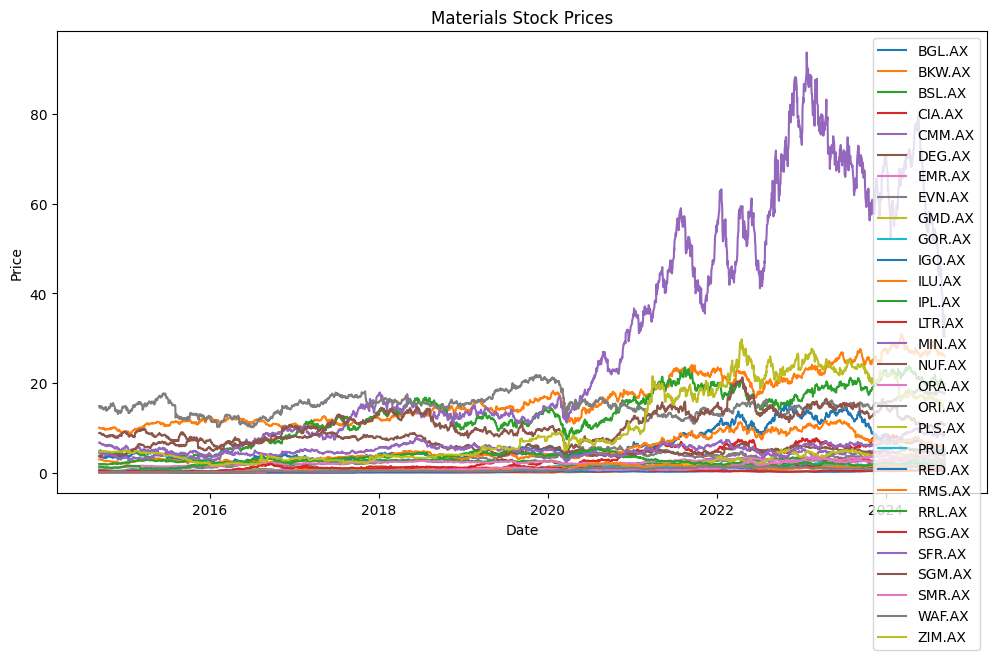

In [ ]:
# Plot the prices over time
plt.figure(figsize=(12, 6))
for column in materials_data.columns:
  plt.plot(materials_data[column], label=column)
plt.title('Materials Stock Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [ ]:
materials_sig = find_cointegrated_pairs_with_pvalues(materials_data)
materials_sig

[{'pair': ('BGL.AX', 'BKW.AX'), 'pvalue': 0.006129301763319897},
 {'pair': ('BGL.AX', 'CIA.AX'), 'pvalue': 0.03920002395663916},
 {'pair': ('BGL.AX', 'GOR.AX'), 'pvalue': 0.025607285816411952},
 {'pair': ('BKW.AX', 'CIA.AX'), 'pvalue': 0.02888824104267693},
 {'pair': ('BKW.AX', 'CMM.AX'), 'pvalue': 0.031147896089822706},
 {'pair': ('BKW.AX', 'GMD.AX'), 'pvalue': 0.04917538460443567},
 {'pair': ('BKW.AX', 'PRU.AX'), 'pvalue': 0.020741112668969098},
 {'pair': ('CIA.AX', 'DEG.AX'), 'pvalue': 0.014994521055281507},
 {'pair': ('CIA.AX', 'GOR.AX'), 'pvalue': 0.04483441741409619},
 {'pair': ('CIA.AX', 'LTR.AX'), 'pvalue': 0.04517120245783302},
 {'pair': ('CMM.AX', 'GMD.AX'), 'pvalue': 0.010545341438021006},
 {'pair': ('CMM.AX', 'PRU.AX'), 'pvalue': 0.013521839310659948},
 {'pair': ('EVN.AX', 'NUF.AX'), 'pvalue': 0.04984511156826984},
 {'pair': ('IGO.AX', 'LTR.AX'), 'pvalue': 0.031622200086814996},
 {'pair': ('IGO.AX', 'ZIM.AX'), 'pvalue': 0.022068450858105982},
 {'pair': ('ILU.AX', 'LTR.AX'),

In [ ]:
materials_pairs = [pair['pair'] for pair in materials_sig]
print(materials_pairs)


[('BGL.AX', 'BKW.AX'), ('BGL.AX', 'CIA.AX'), ('BGL.AX', 'GOR.AX'), ('BKW.AX', 'CIA.AX'), ('BKW.AX', 'CMM.AX'), ('BKW.AX', 'GMD.AX'), ('BKW.AX', 'PRU.AX'), ('CIA.AX', 'DEG.AX'), ('CIA.AX', 'GOR.AX'), ('CIA.AX', 'LTR.AX'), ('CMM.AX', 'GMD.AX'), ('CMM.AX', 'PRU.AX'), ('EVN.AX', 'NUF.AX'), ('IGO.AX', 'LTR.AX'), ('IGO.AX', 'ZIM.AX'), ('ILU.AX', 'LTR.AX'), ('ILU.AX', 'ZIM.AX'), ('LTR.AX', 'MIN.AX'), ('LTR.AX', 'PLS.AX'), ('LTR.AX', 'ZIM.AX'), ('MIN.AX', 'ZIM.AX'), ('NUF.AX', 'RED.AX'), ('NUF.AX', 'RMS.AX'), ('ORA.AX', 'SGM.AX'), ('PLS.AX', 'SMR.AX')]


In [ ]:
material_params = calculate_params_with_kalman_filter_dynamic(materials_data, materials_sig)

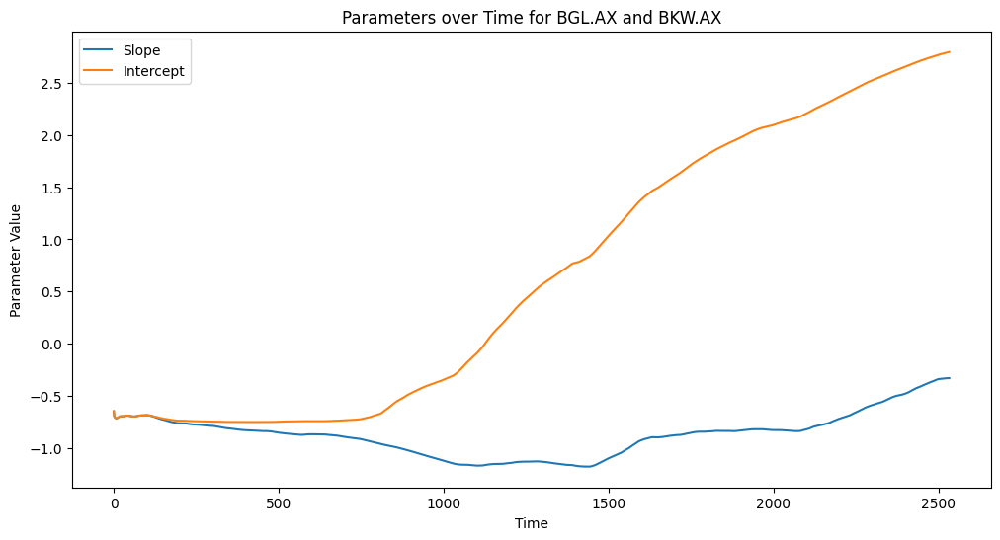

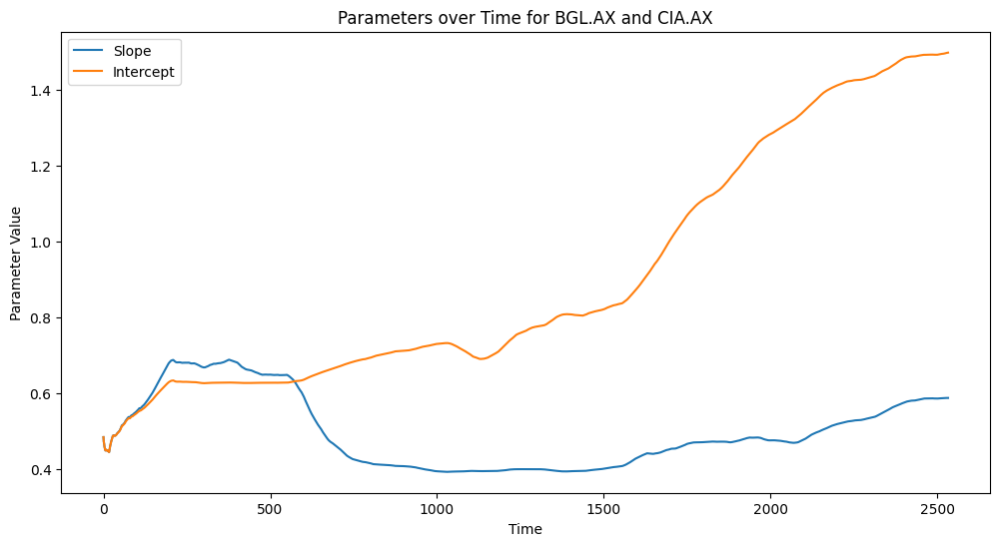

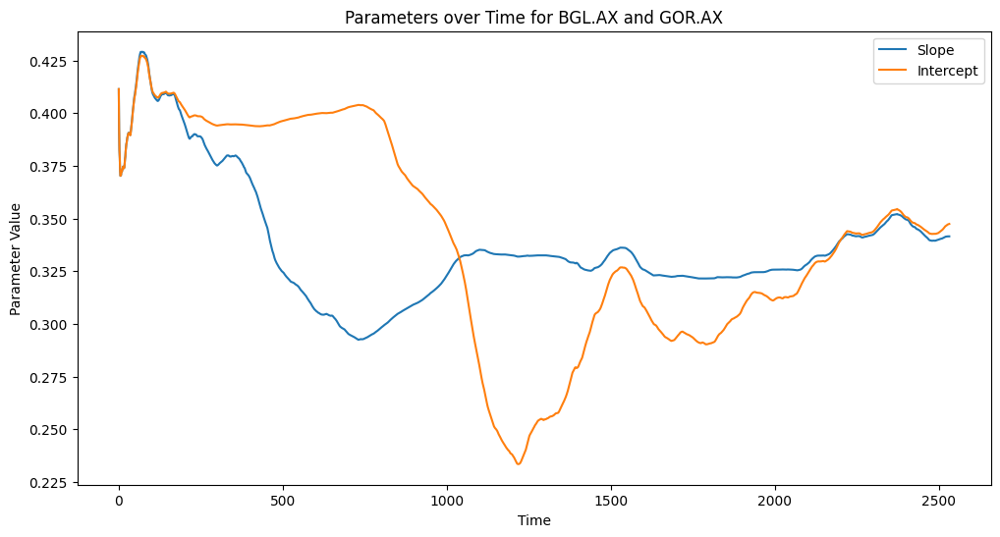

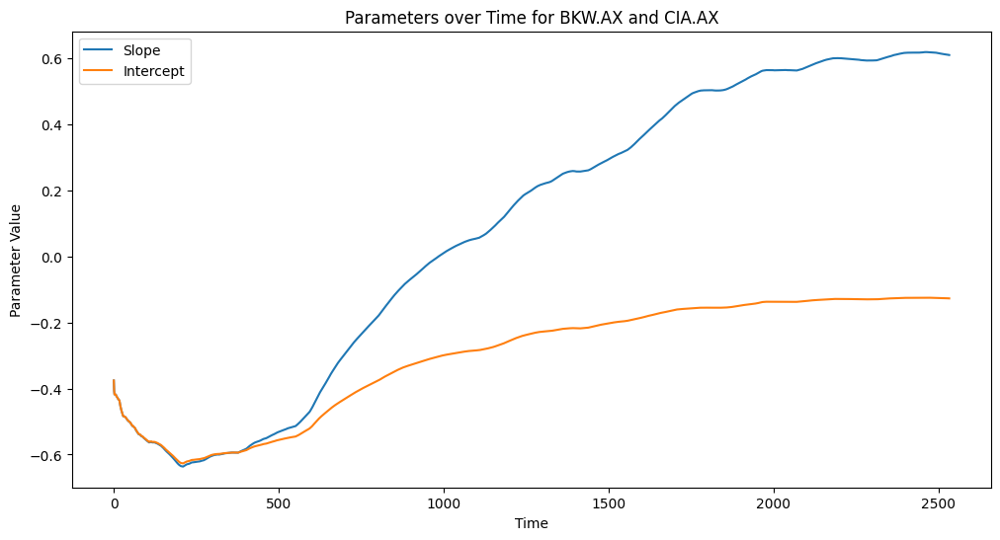

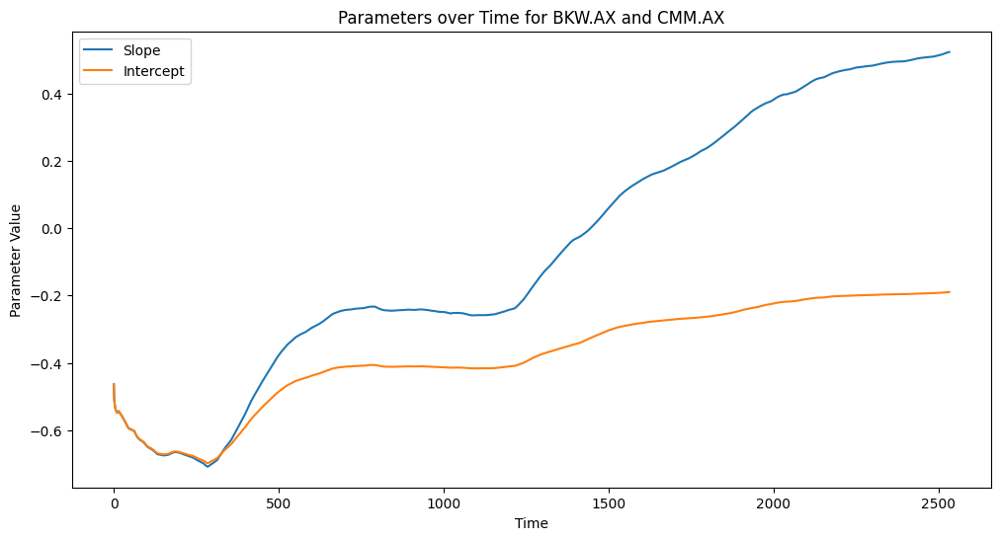

...

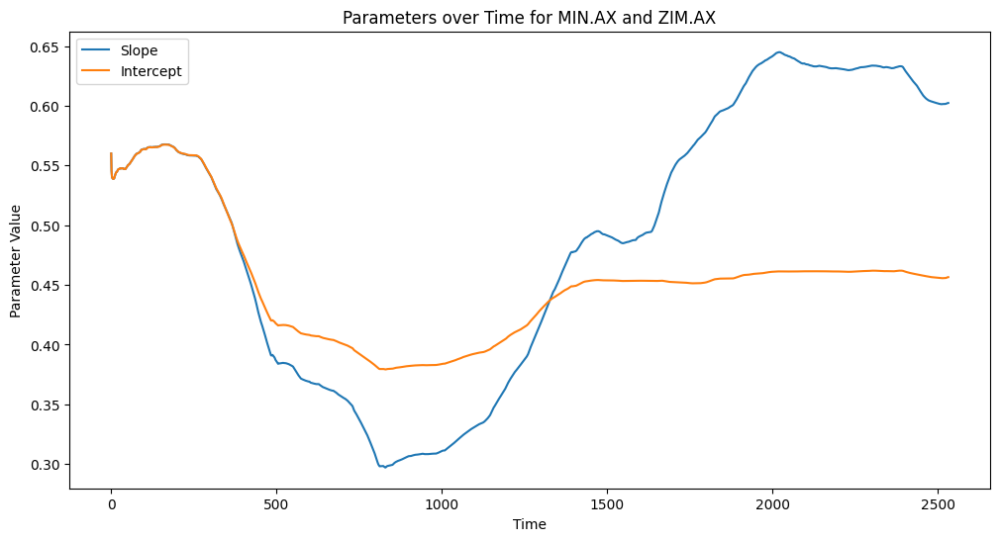

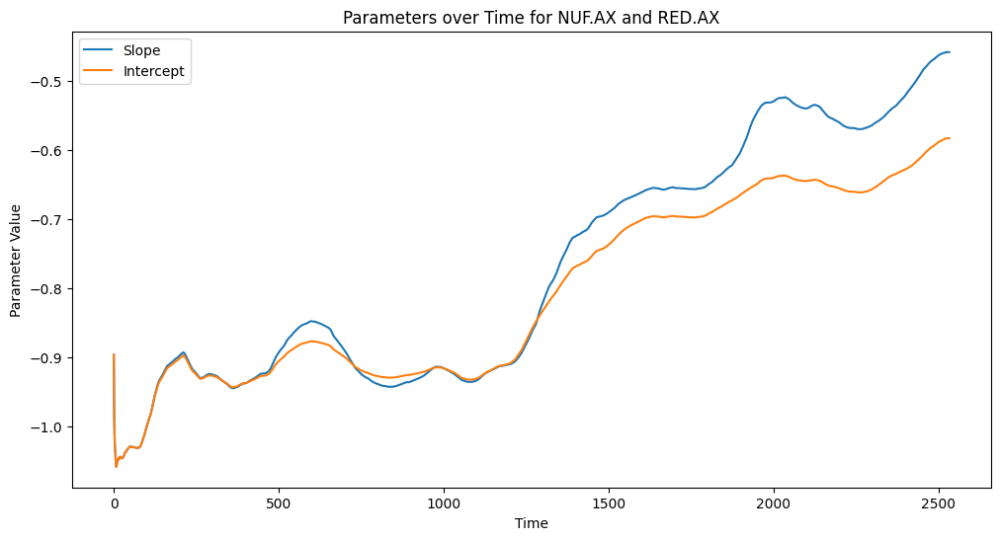

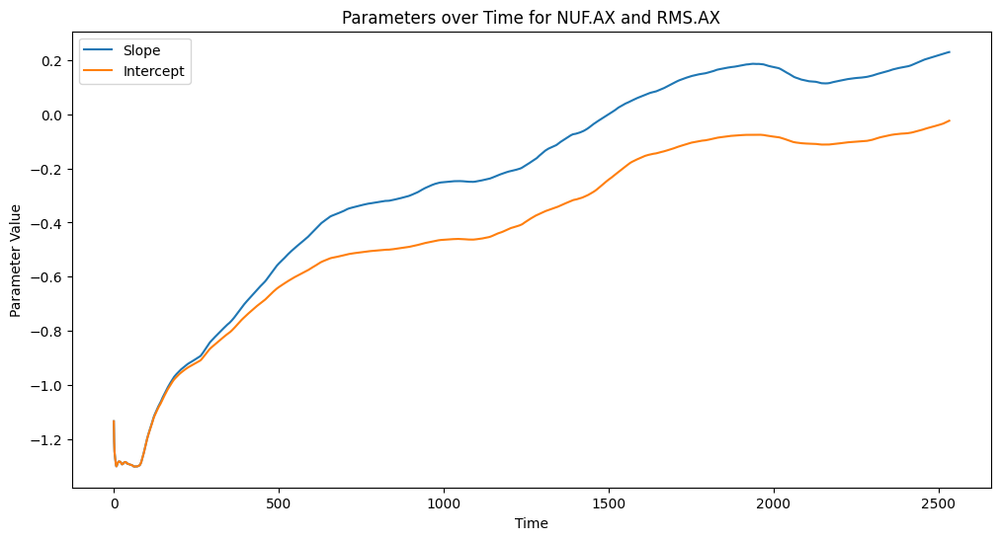

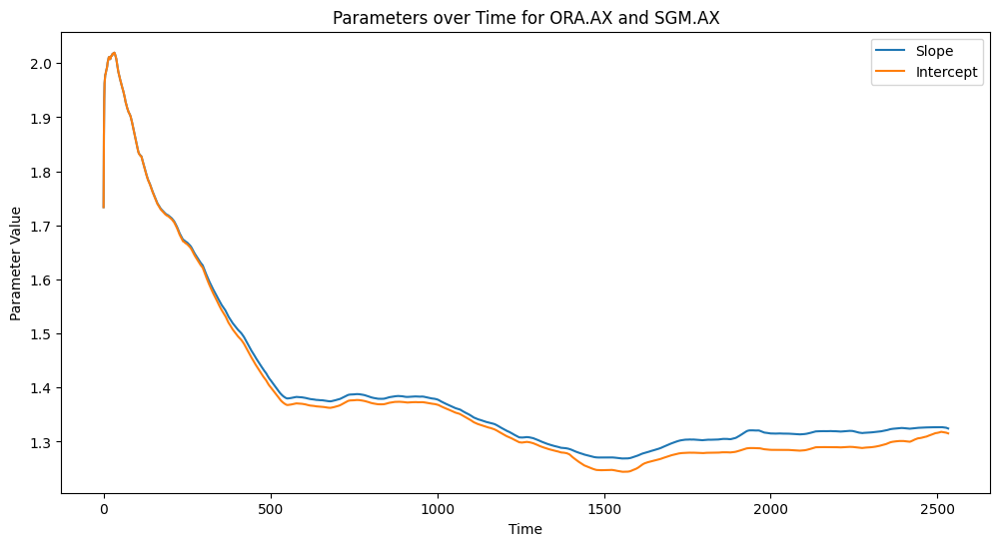

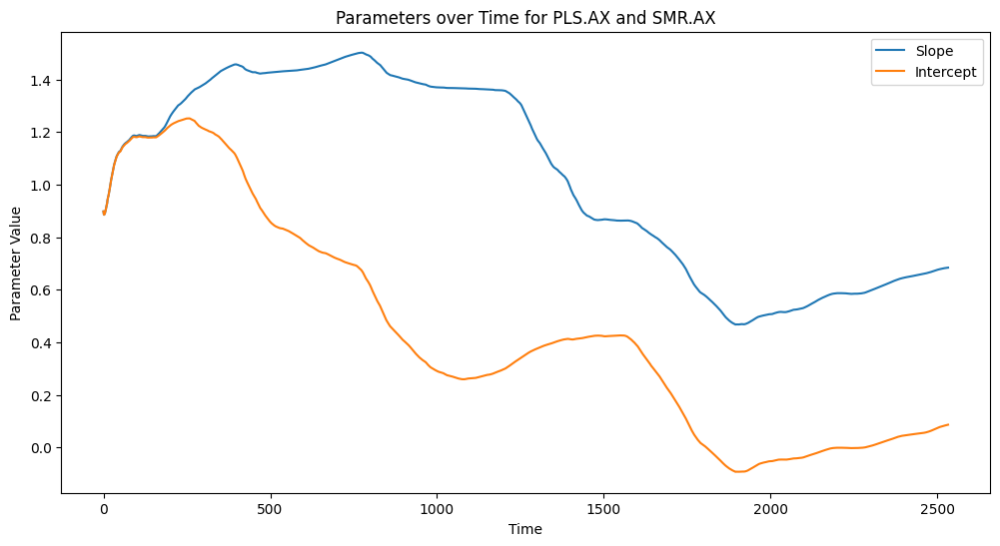

In [ ]:
# Plot the parameters over time for each pair
for pair, params in material_params.items():
  slope = params['slope']
  intercept = params['intercept']

  plt.figure(figsize=(12, 6))
  plt.plot(slope, label='Slope')
  plt.plot(intercept, label='Intercept')

  plt.title(f'Parameters over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Parameter Value')
  plt.legend()
  plt.show()


In [ ]:
materials_spreads = calculate_spread_and_zscore(materials_data, material_params)


In [ ]:
# Drop NaNs in the materials spreads
for pair, spread in materials_spreads.items():
  if '_zscore' in pair:
    materials_spreads[pair] = spread.dropna()


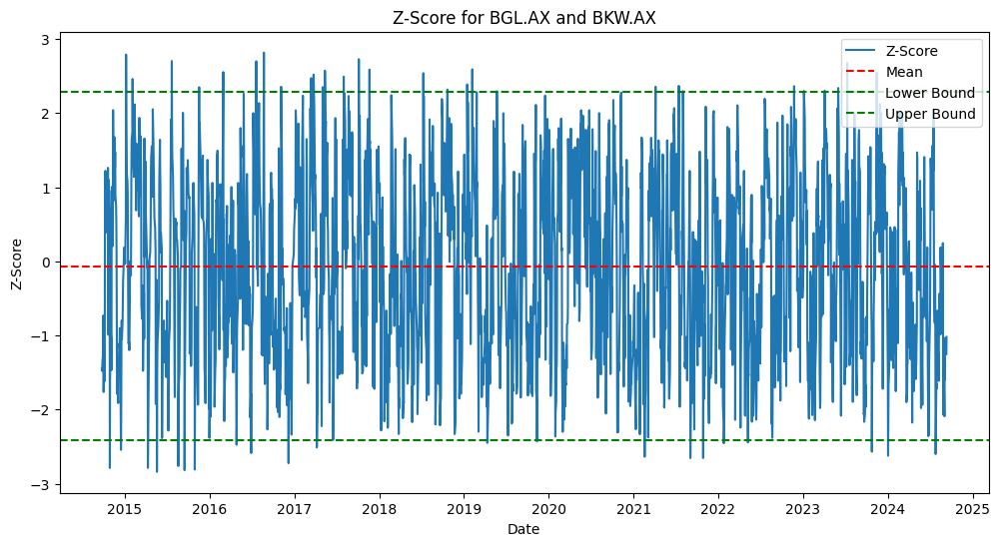

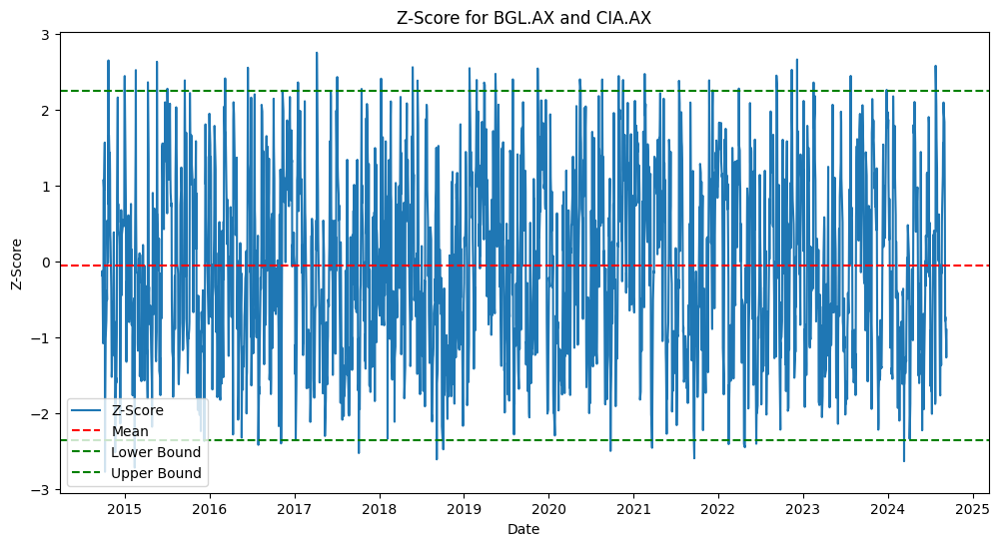

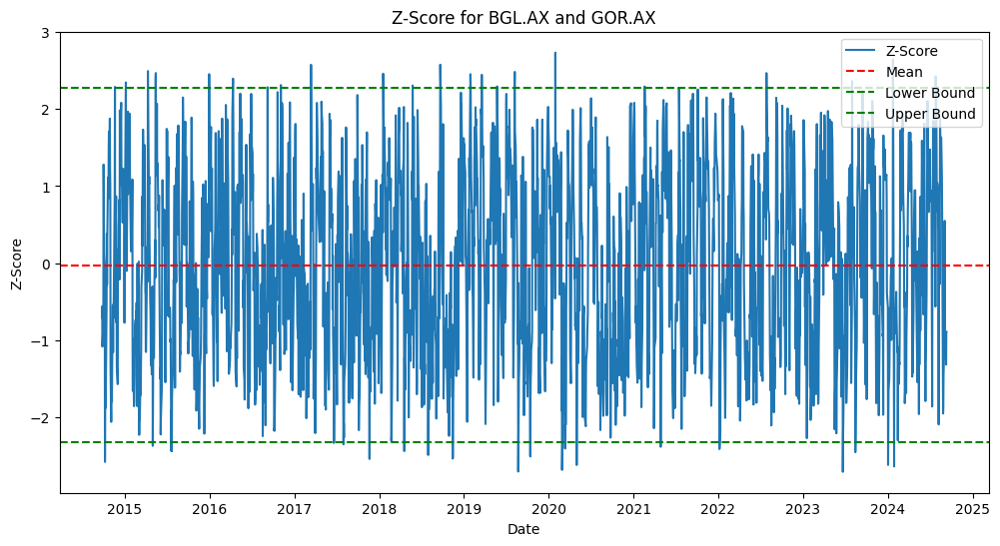

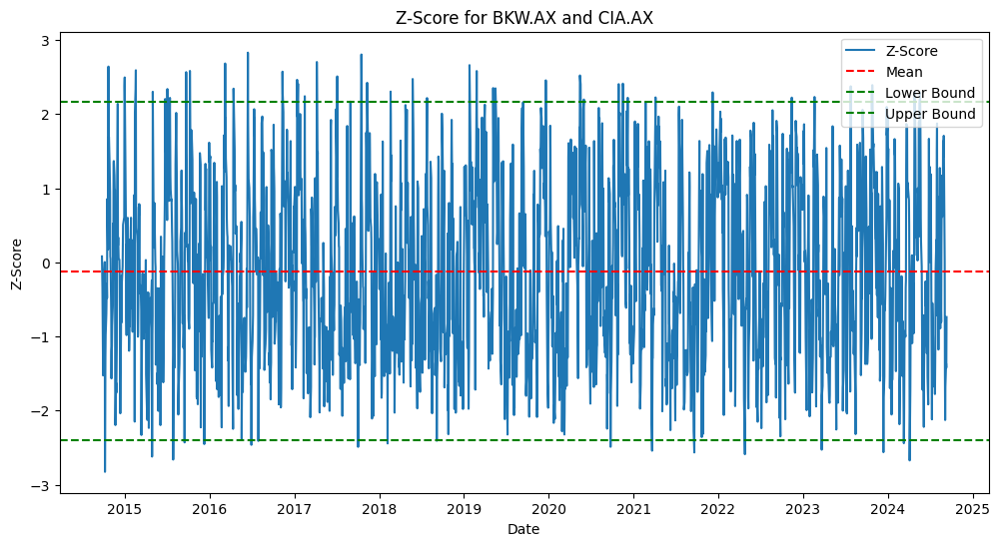

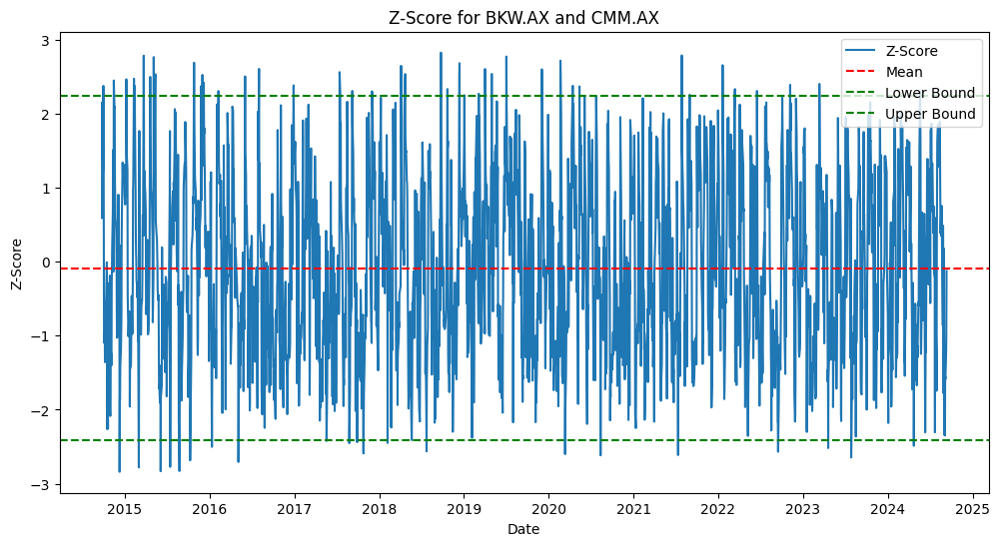

...

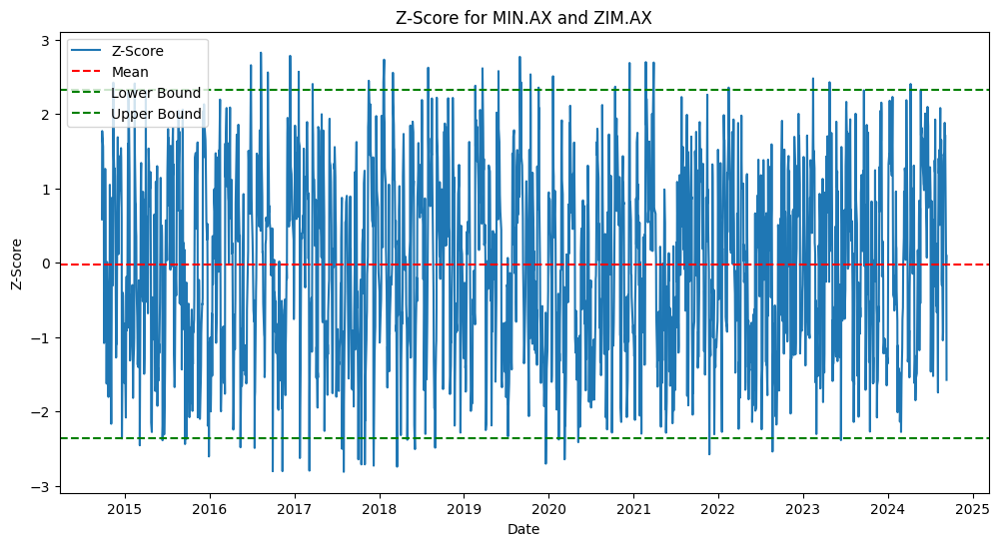

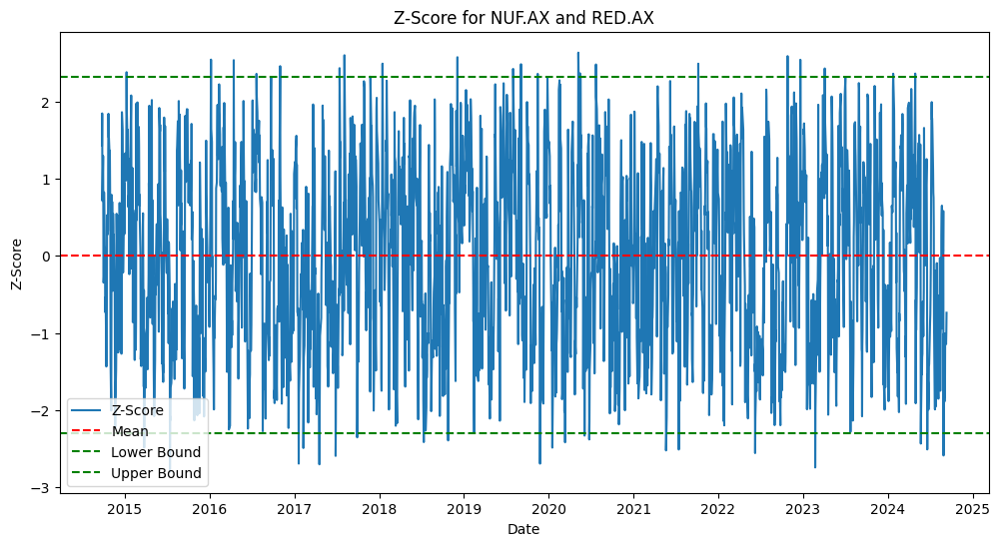

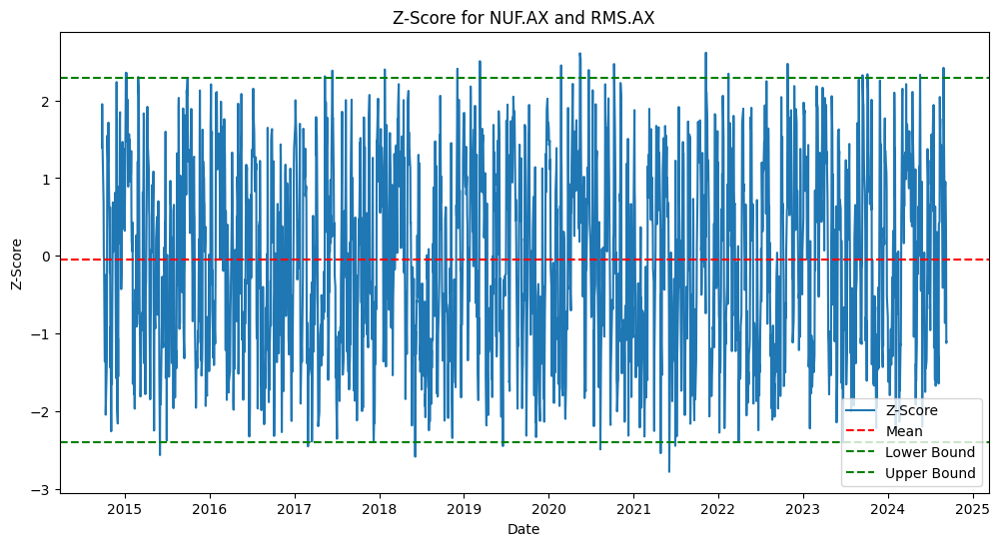

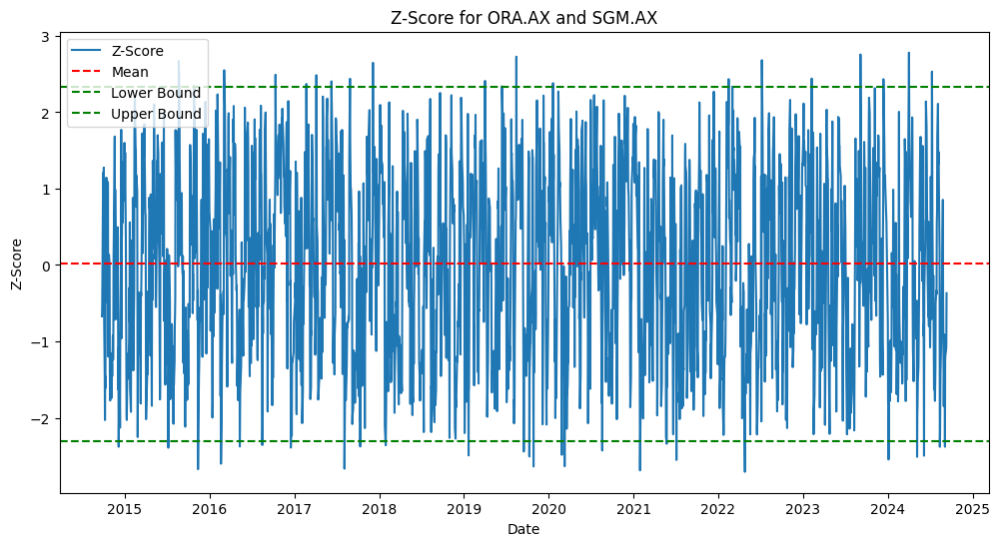

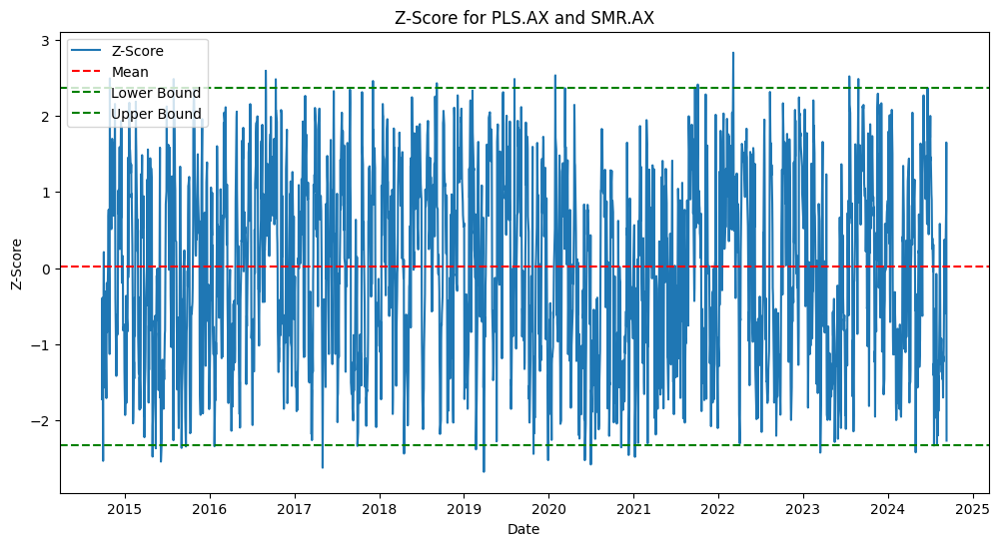

In [231]:
plot_zscore_with_bounds(materials_spreads)

In [ ]:
materials_results = backtest_zscore_strategy(materials_data, materials_spreads, material_params)

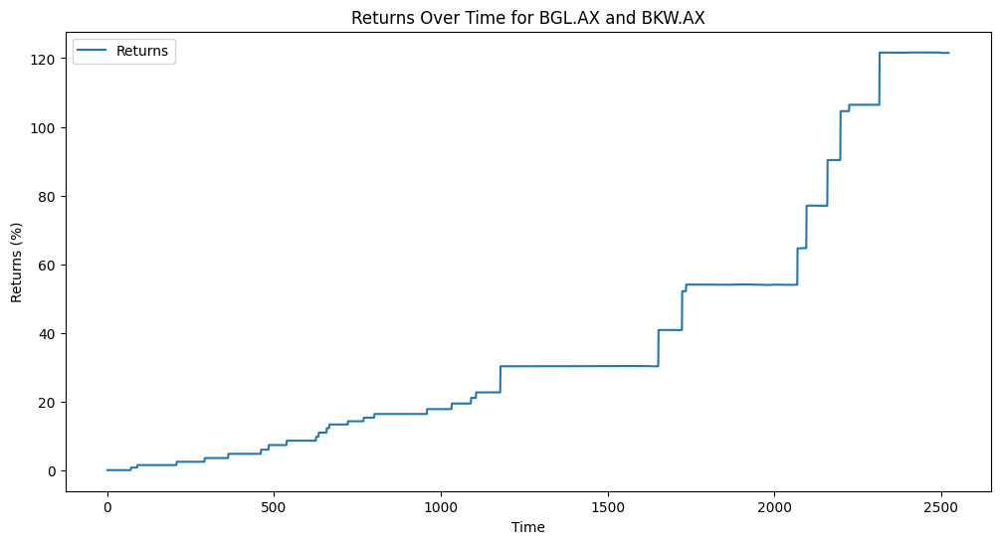

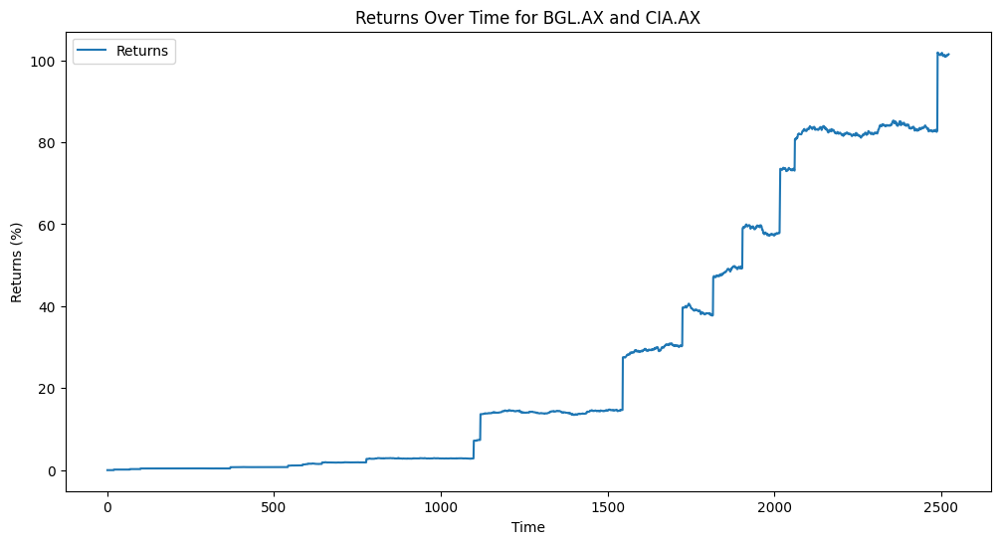

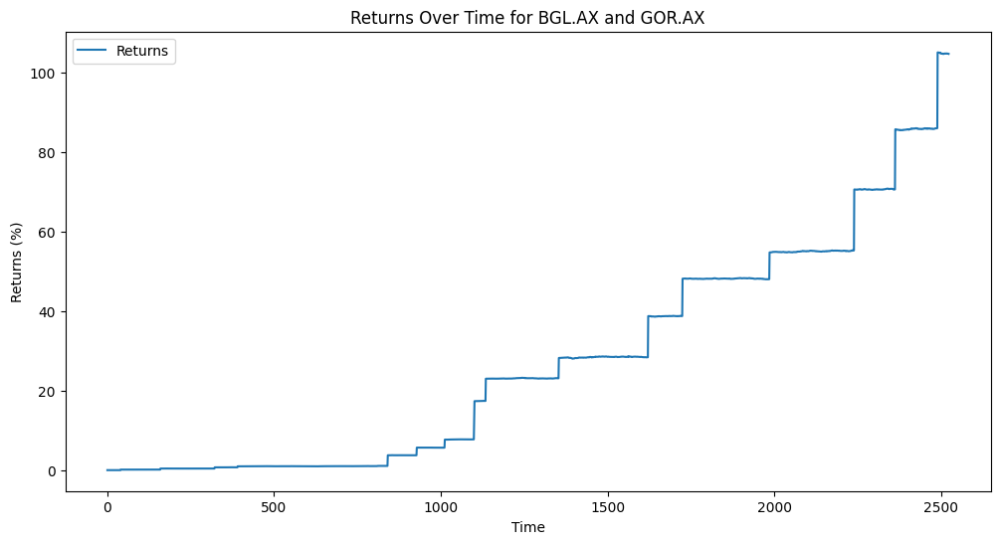

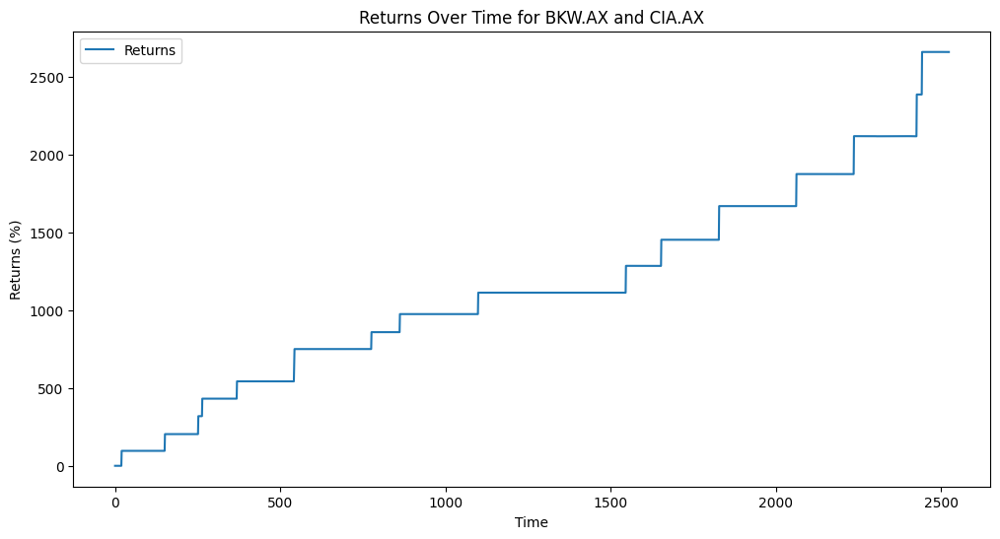

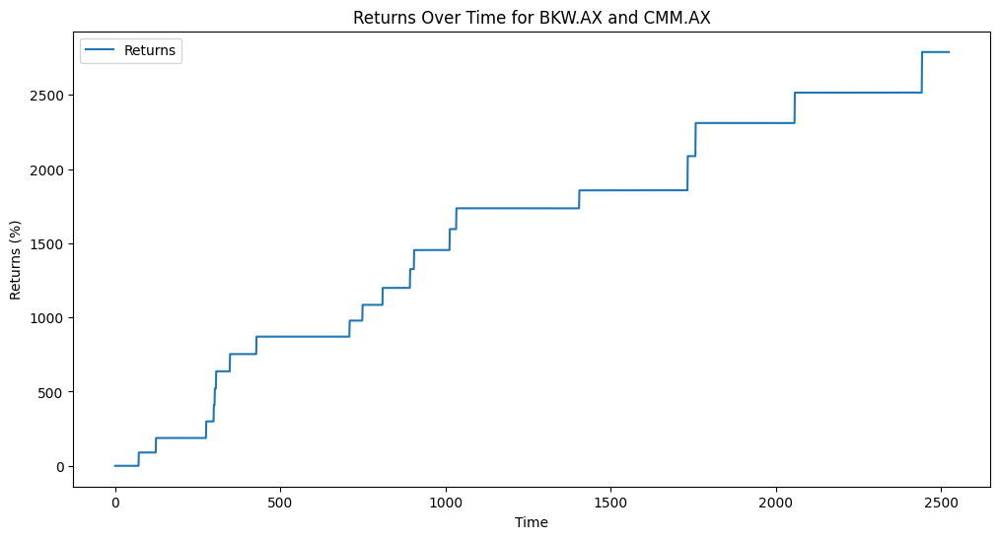

...

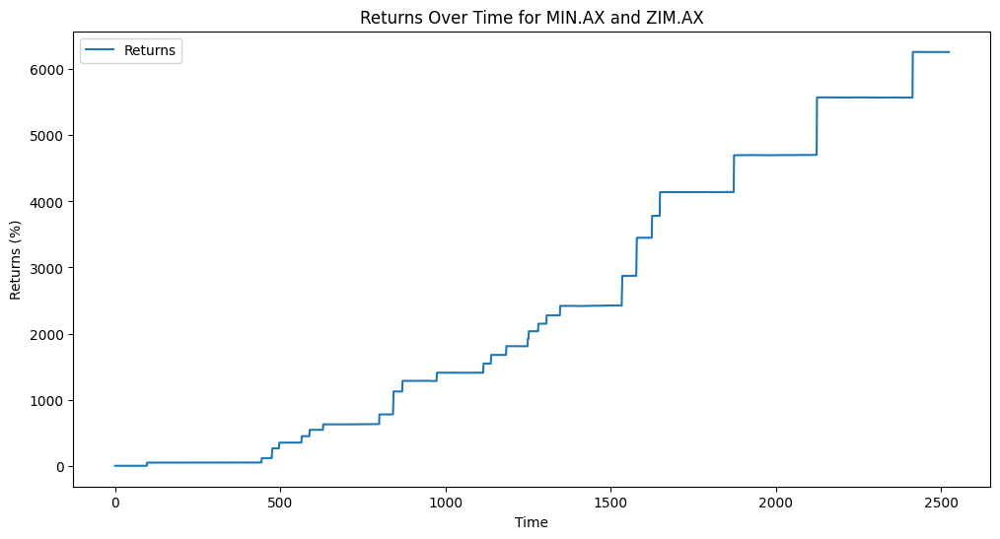

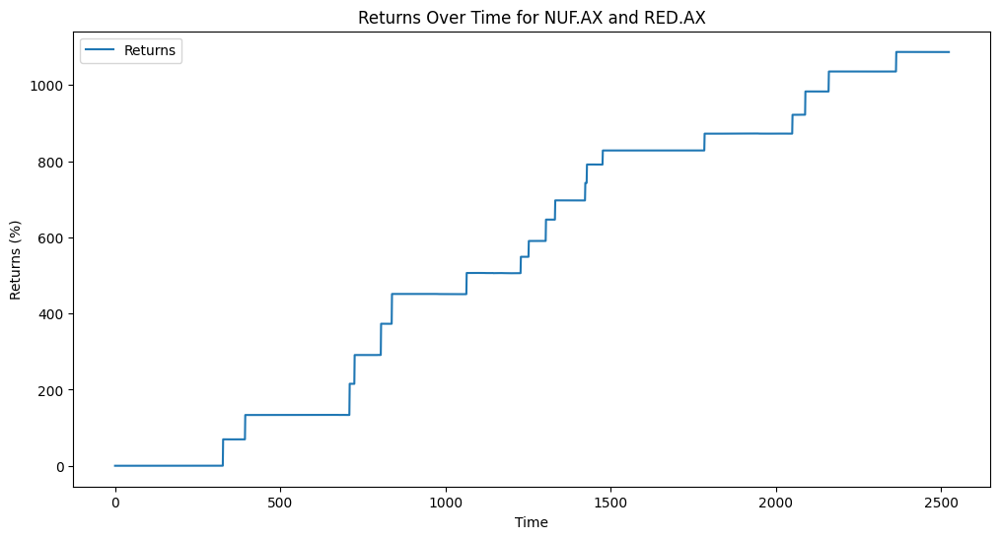

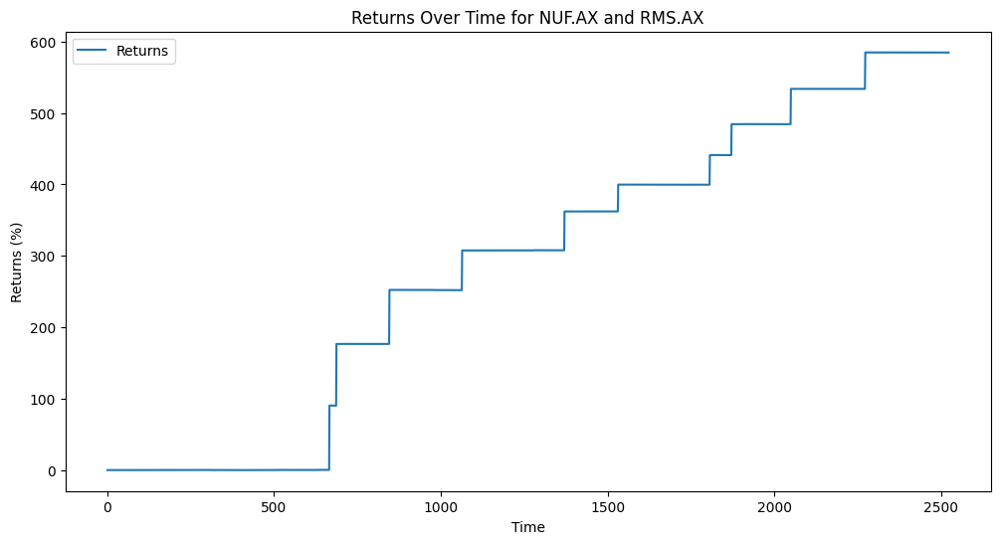

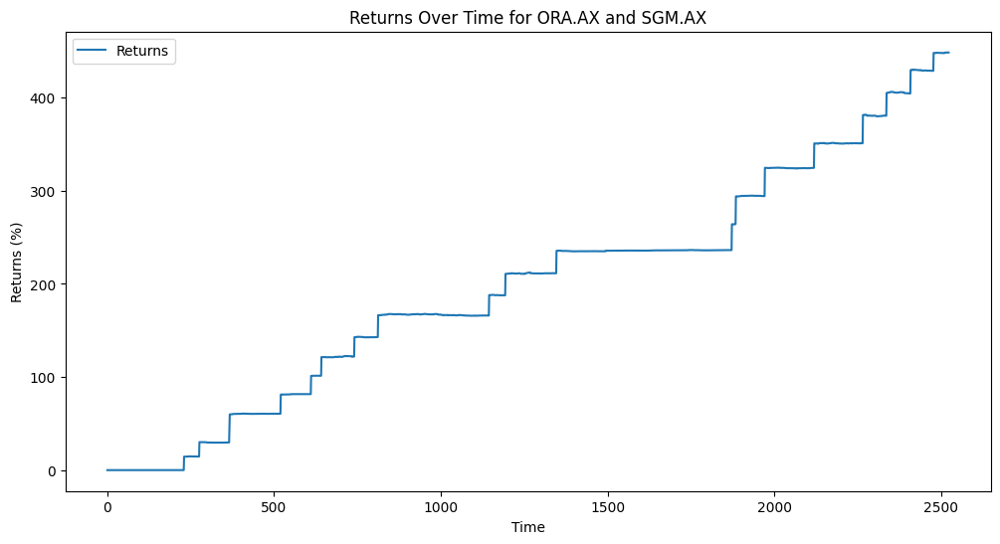

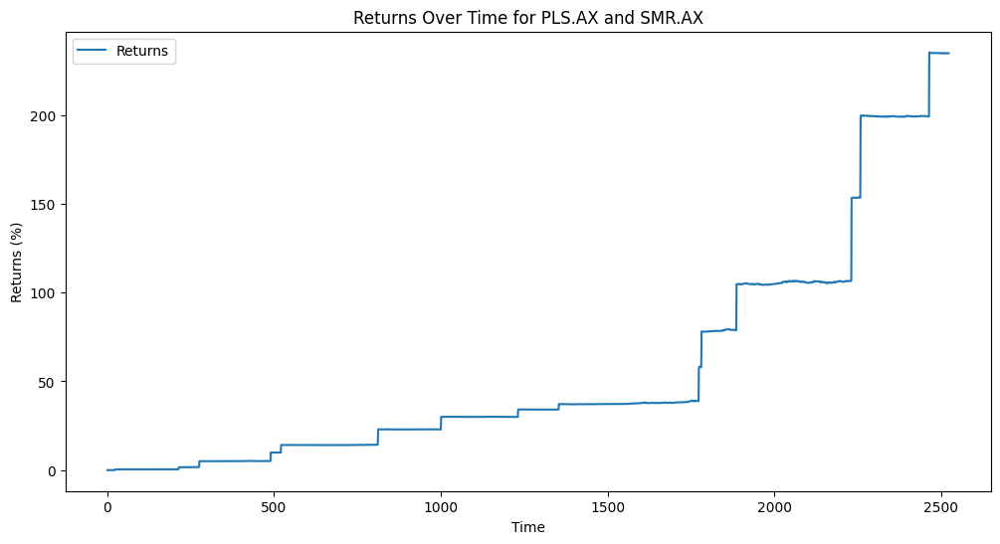

In [ ]:
# Plot the returns over time for each pair
for pair, result in materials_results.items():
  returns_over_time = result['returns_over_time']
  plt.figure(figsize=(12, 6))
  plt.plot(returns_over_time, label='Returns')
  plt.title(f'Returns Over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Returns (%)')
  plt.legend()
  plt.show()


In [ ]:
performance_metrics(materials_results)

,Stock 1,Stock 2,Total % Return,Annualized % Return,Sharpe Ratio,Number of Trades
0,BGL.AX,BKW.AX,121.529175,8.234523,1.427846,69
1,BGL.AX,CIA.AX,101.480870,7.217886,1.417194,96
2,BGL.AX,GOR.AX,104.717337,7.388004,1.686212,86
3,BKW.AX,CIA.AX,2661.933764,39.117466,0.390437,87
4,BKW.AX,CMM.AX,2789.363654,39.743141,0.317215,87
5,BKW.AX,GMD.AX,3598.448243,43.217869,0.281479,86
6,BKW.AX,PRU.AX,2305.631884,37.218932,0.415963,48
7,CIA.AX,DEG.AX,567.841357,20.793645,0.682147,97
8,CIA.AX,GOR.AX,364.164276,16.499757,1.016654,80
9,CIA.AX,LTR.AX,830.102106,24.840641,0.574324,113


Healthcare

In [213]:
# Now we look at Australian Consumer Discretionary  stocks in the range of $10B to $1B
consumer_tickers = ["JBH.AX", "HVN.AX", "PMV.ASX", "BRG.AX", "FLT.AX", "IEL.AX", "GYG.AX", "SUL.AX","LNW.AX", "ARB.AX", "LOV.AX", "WEB.AX", "DMP.AX", "APE.DX", "CTD.DX", "BAP.AX", "AOV.AX", "TPW.AX", "SGR.AX", "SNL.AX", "NCK.AX", "AX1.AX"]

In [214]:
# Download the data
consumer_data = yf.download(consumer_tickers, period="10y")['Adj Close']
consumer_data.head()

[*********************100%***********************]  22 of 22 completed
ERROR:yfinance:
6 Failed downloads:
ERROR:yfinance:['LNW.AX']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', '6mo', '1y', '2y', 'ytd', 'max']")
ERROR:yfinance:['AOV.AX', 'GYG.AX']: YFInvalidPeriodError("%ticker%: Period '10y' is invalid, must be one of ['1d', '5d', '1mo', '3mo', 'ytd', 'max']")
ERROR:yfinance:['CTD.DX', 'PMV.ASX', 'APE.DX']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (period=10y) (Yahoo error = "No data found, symbol may be delisted")')


Ticker,AOV.AX,APE.DX,ARB.AX,AX1.AX,BAP.AX,BRG.AX,CTD.DX,DMP.AX,FLT.AX,GYG.AX,...,JBH.AX,LNW.AX,LOV.AX,NCK.AX,PMV.ASX,SGR.AX,SNL.AX,SUL.AX,TPW.AX,WEB.AX
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-11 00:00:00+00:00,NaN,NaN,9.835091,0.360867,1.821621,5.997420,NaN,20.810114,33.218277,NaN,...,10.038407,NaN,NaN,1.733564,NaN,2.275198,1.535123,5.200780,NaN,1.869053
2014-09-12 00:00:00+00:00,NaN,NaN,9.873065,0.357957,1.807106,6.068348,NaN,20.769041,32.911953,NaN,...,10.061972,NaN,NaN,1.733564,NaN,2.254067,1.535123,5.277611,NaN,1.838907
2014-09-15 00:00:00+00:00,NaN,NaN,9.630036,0.363778,1.792591,5.950133,NaN,20.810114,32.819347,NaN,...,10.014844,NaN,NaN,1.733564,NaN,2.282243,1.535123,5.141681,NaN,1.863024
2014-09-16 00:00:00+00:00,NaN,NaN,9.584467,0.352137,1.778077,5.839800,NaN,20.374689,33.054432,NaN,...,9.808654,NaN,NaN,1.727843,NaN,2.275198,1.535123,5.112131,NaN,1.784645
2014-09-17 00:00:00+00:00,NaN,NaN,9.622443,0.340496,1.763561,5.775627,NaN,20.588295,32.887081,NaN,...,9.808654,NaN,NaN,1.670630,NaN,2.232935,1.522058,5.123951,NaN,1.784645


In [215]:
# Count the NaNs in each column
print(consumer_data.isna().sum())


Ticker
AOV.AX     2533
APE.DX     2533
ARB.AX        0
AX1.AX        0
BAP.AX        0
BRG.AX        0
CTD.DX     2533
DMP.AX        0
FLT.AX        0
GYG.AX     2533
HVN.AX        0
IEL.AX      308
JBH.AX        0
LNW.AX     2533
LOV.AX       70
NCK.AX        0
PMV.ASX    2533
SGR.AX        0
SNL.AX        0
SUL.AX        0
TPW.AX      318
WEB.AX        0
dtype: int64


In [217]:
# Remove NaN columns
consumer_data = consumer_data.dropna(axis=1)


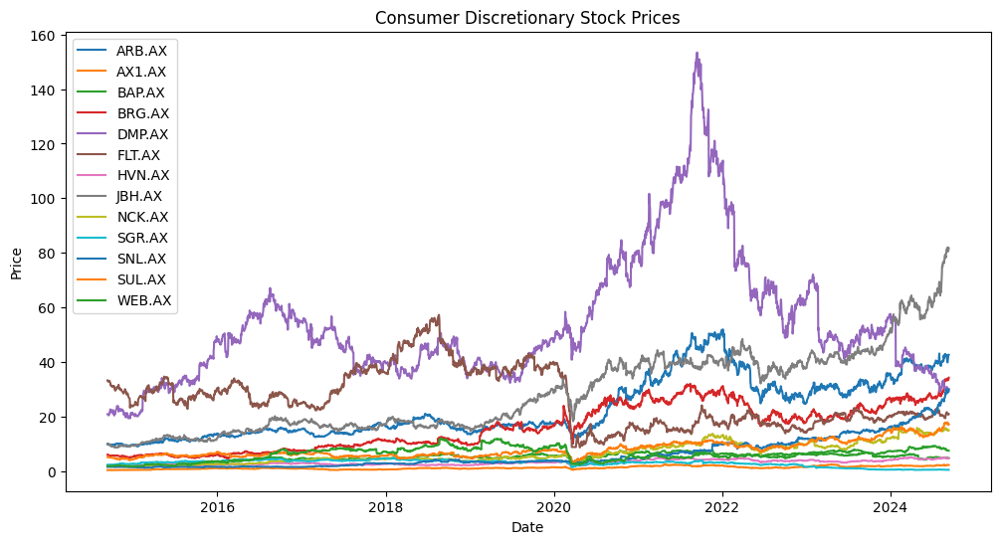

In [218]:
# Plot the prices over time
plt.figure(figsize=(12, 6))
for column in consumer_data.columns:
  plt.plot(consumer_data[column], label=column)
plt.title('Consumer Discretionary Stock Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [219]:
# Find the cointegrated pairs
consumer_sig = find_cointegrated_pairs_with_pvalues(consumer_data)
consumer_sig


[{'pair': ('ARB.AX', 'HVN.AX'), 'pvalue': 0.019828373628158796},
 {'pair': ('AX1.AX', 'BRG.AX'), 'pvalue': 0.042190618607317015},
 {'pair': ('AX1.AX', 'HVN.AX'), 'pvalue': 0.014468294407154525},
 {'pair': ('HVN.AX', 'NCK.AX'), 'pvalue': 0.026268992814373785},
 {'pair': ('SGR.AX', 'SUL.AX'), 'pvalue': 0.013659321020112572}]

In [220]:
consumer_pairs = [pair['pair'] for pair in consumer_sig]
print(consumer_pairs)


[('ARB.AX', 'HVN.AX'), ('AX1.AX', 'BRG.AX'), ('AX1.AX', 'HVN.AX'), ('HVN.AX', 'NCK.AX'), ('SGR.AX', 'SUL.AX')]


In [221]:
consumer_params = calculate_params_with_kalman_filter_dynamic(consumer_data, consumer_sig)

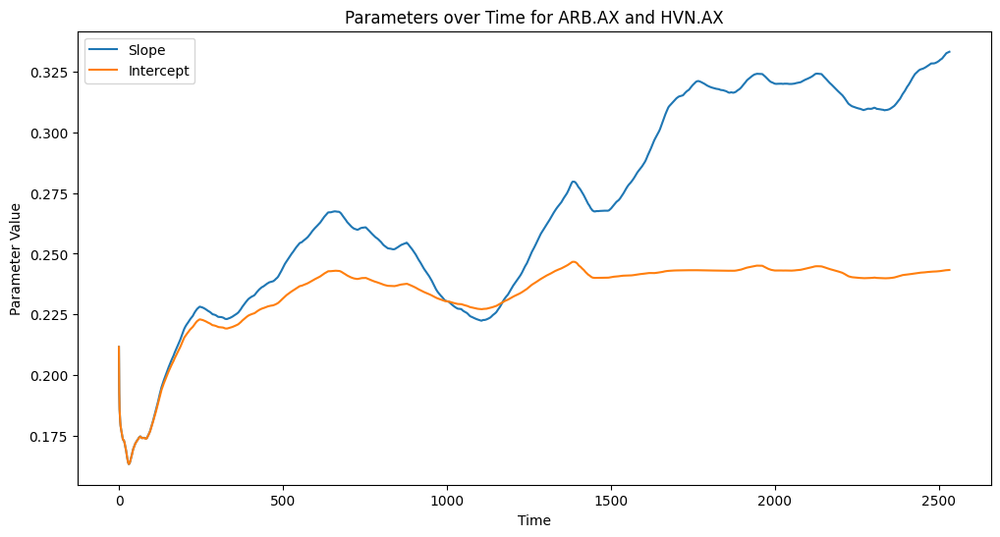

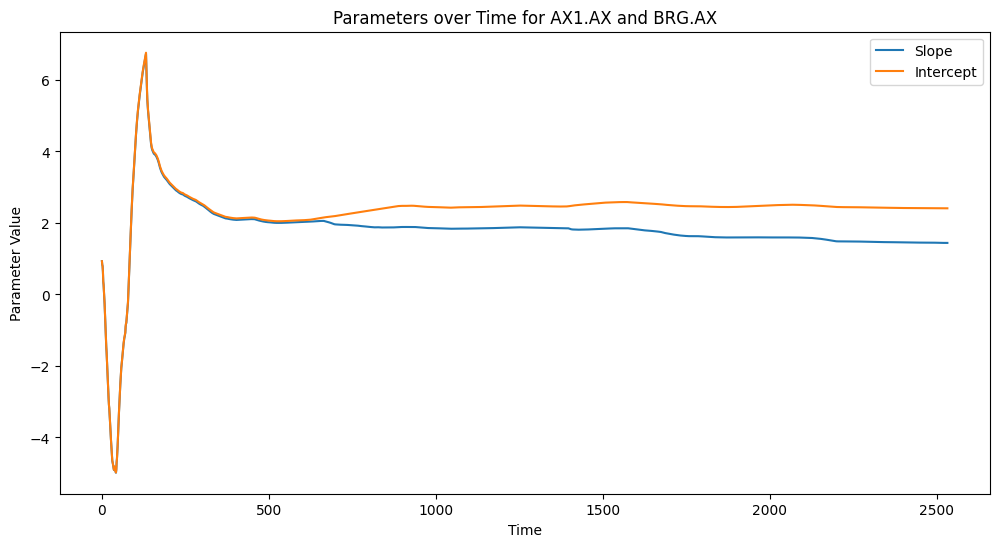

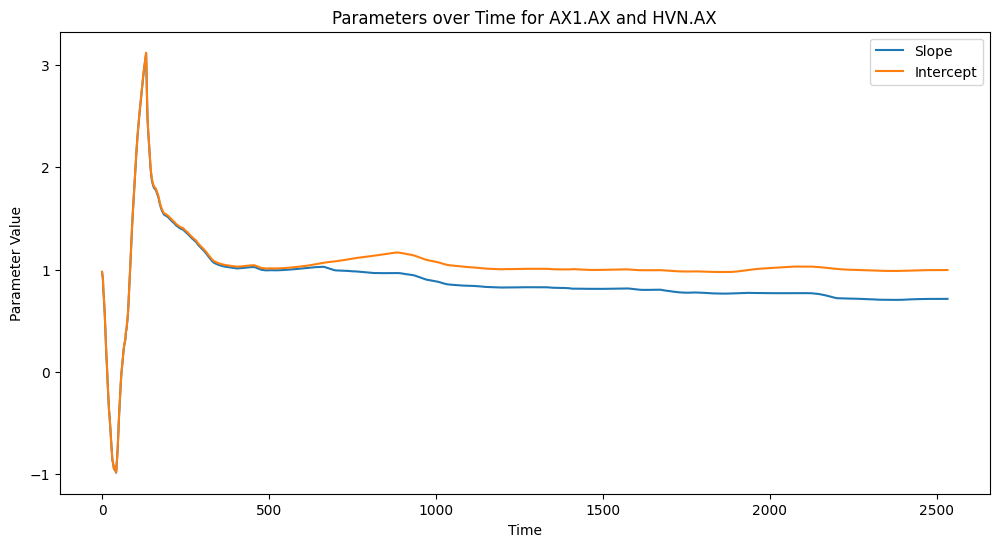

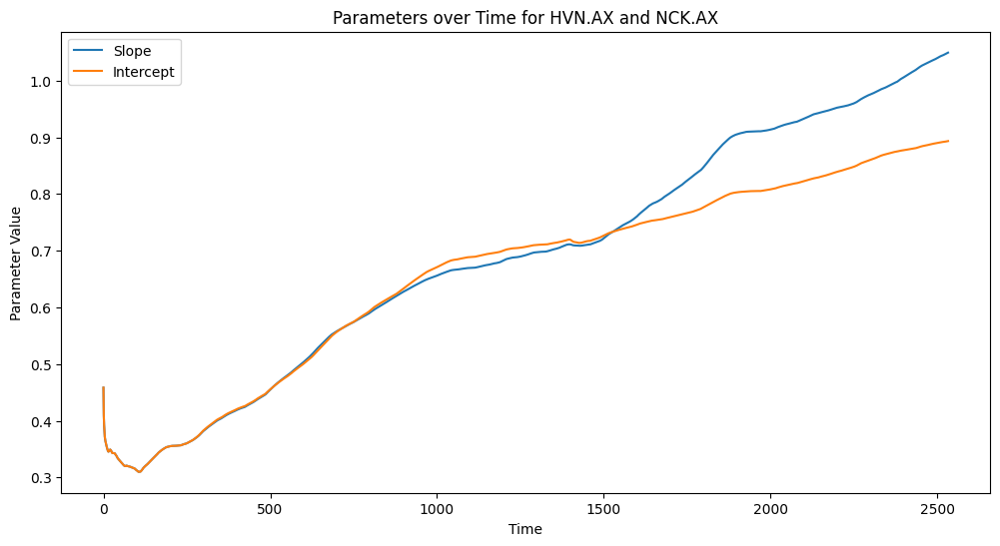

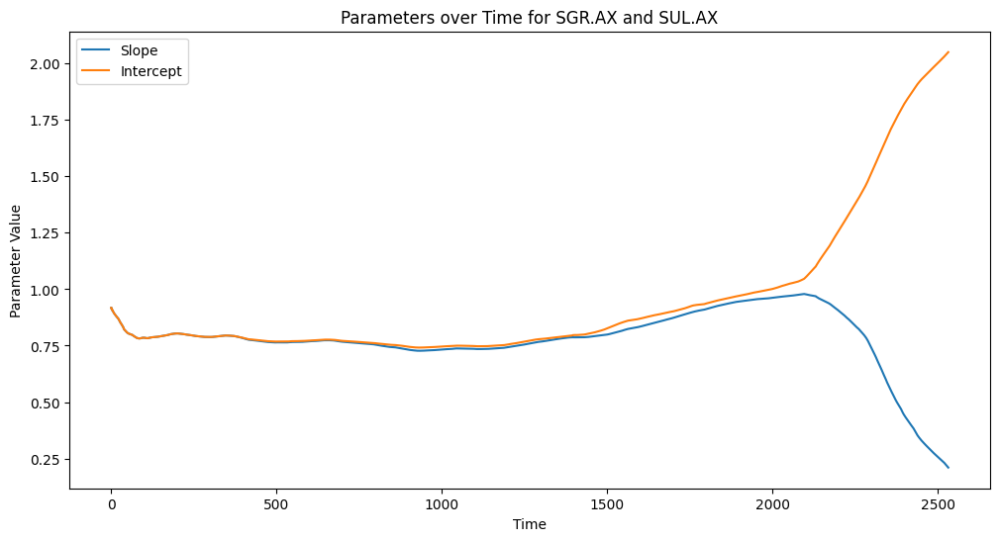

In [222]:
# Plot the parameters over time for each pair
for pair, params in consumer_params.items():
  slope = params['slope']
  intercept = params['intercept']

  plt.figure(figsize=(12, 6))
  plt.plot(slope, label='Slope')
  plt.plot(intercept, label='Intercept')

  plt.title(f'Parameters over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Parameter Value')
  plt.legend()
  plt.show()


In [224]:
consumer_spreads = calculate_spread_and_zscore(consumer_data, consumer_params)

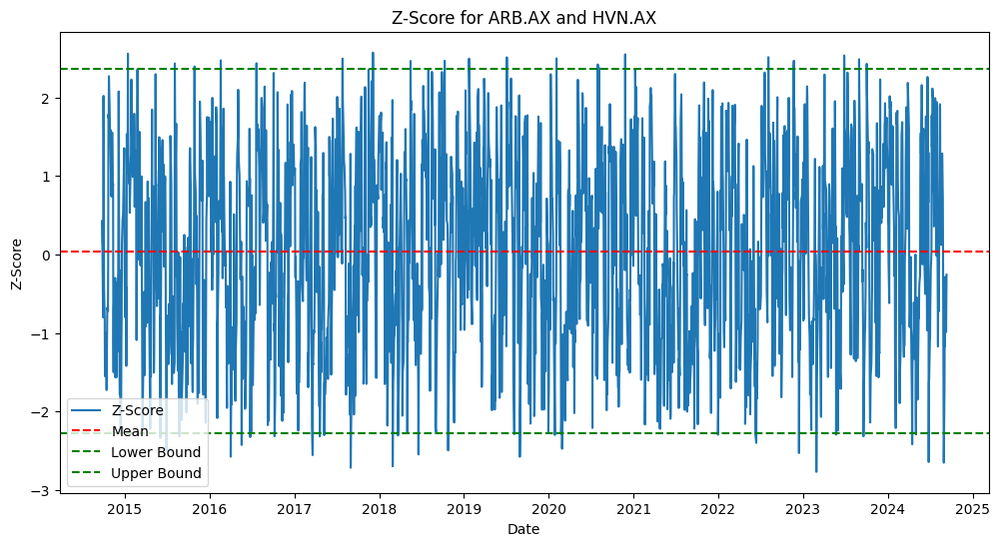

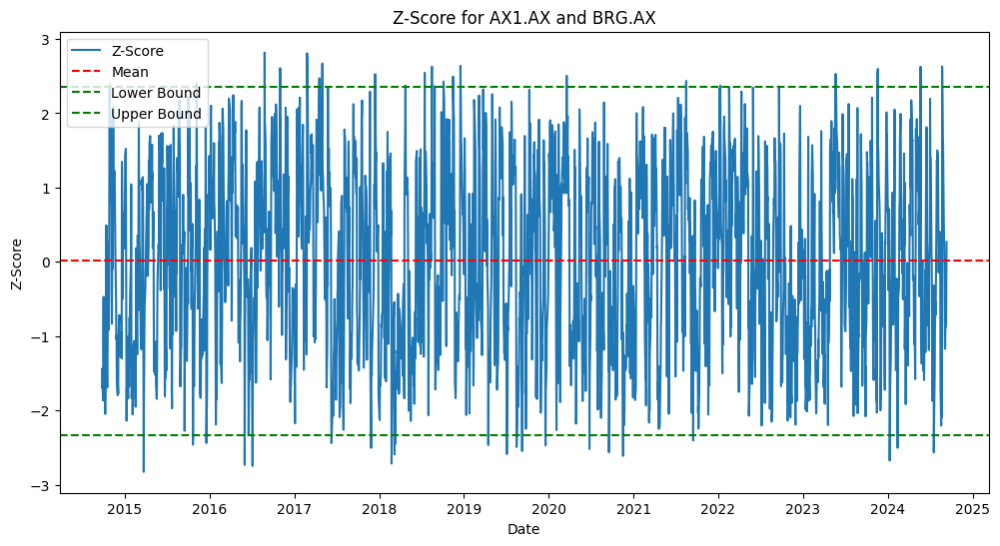

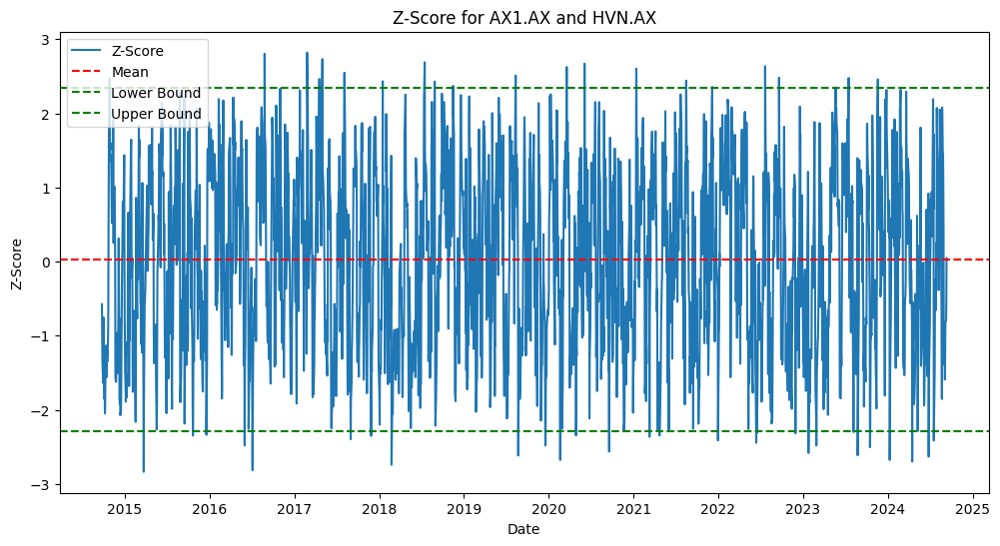

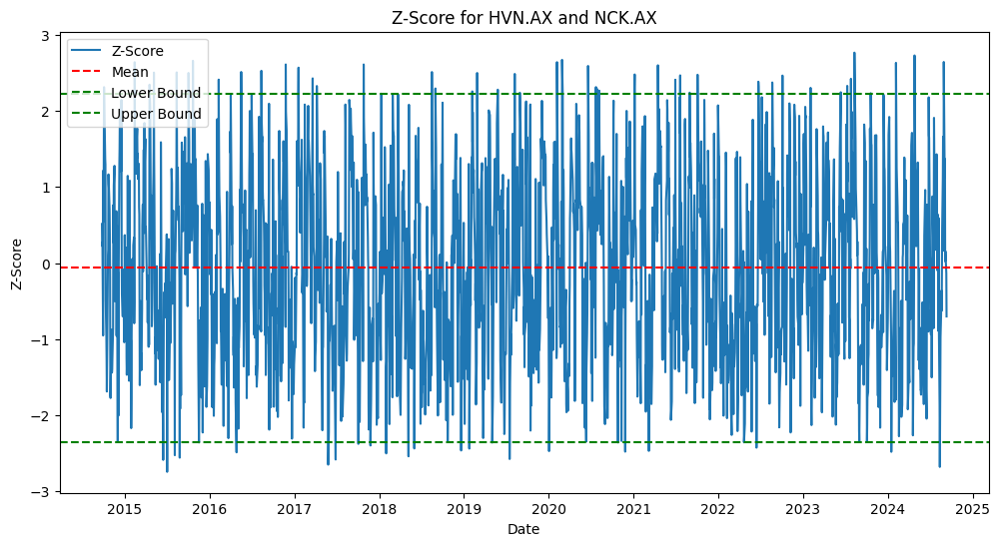

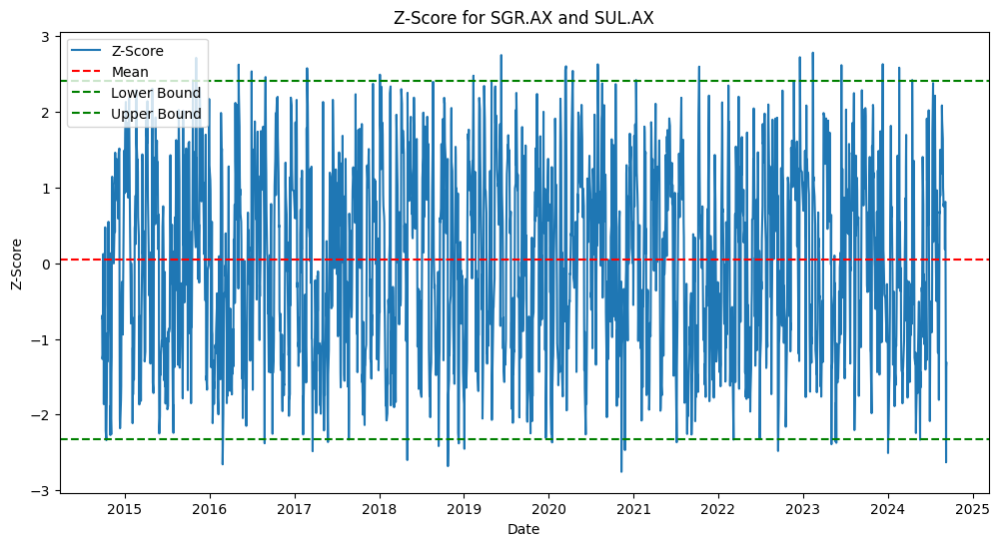

In [233]:
plot_zscore_with_bounds(consumer_spreads)

In [234]:
consumer_results = backtest_zscore_strategy(consumer_data, consumer_spreads, consumer_params)

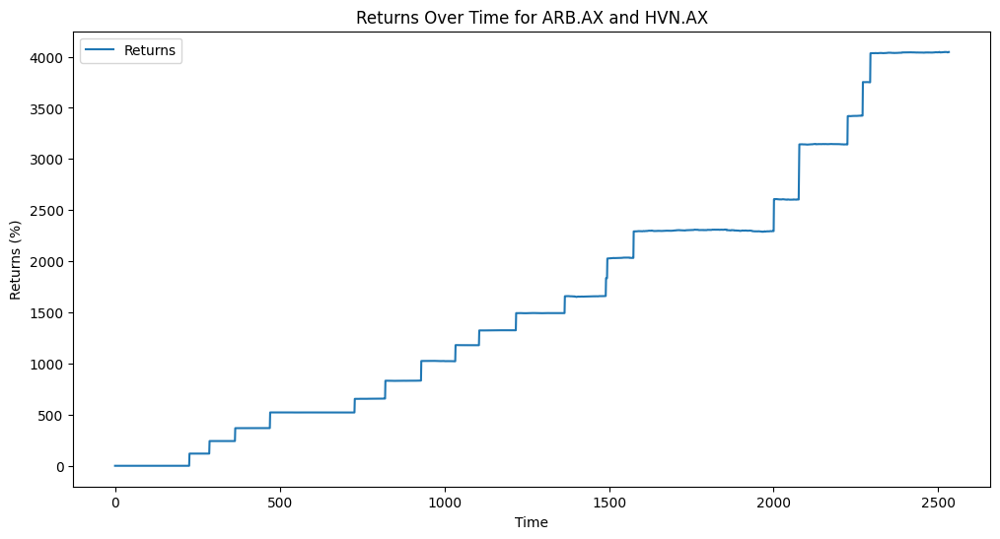

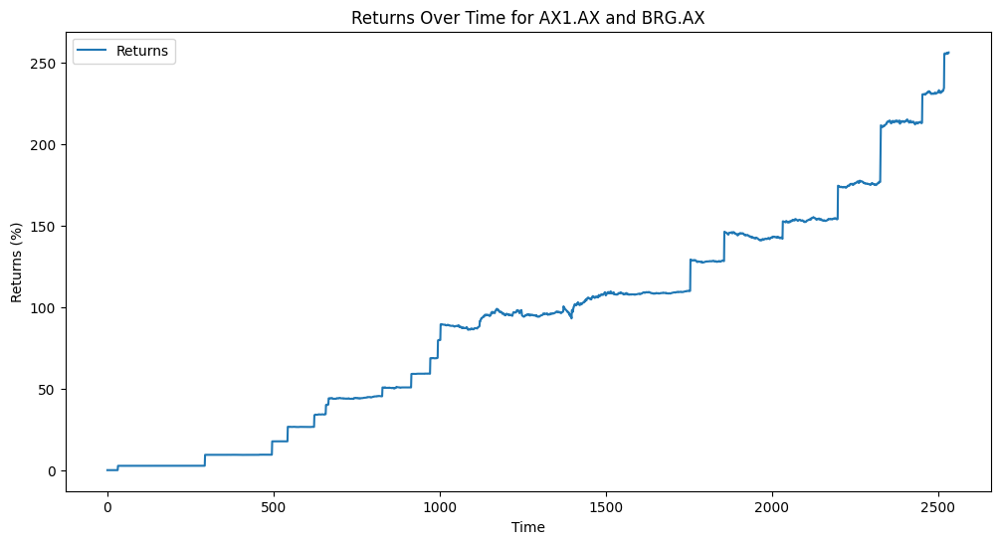

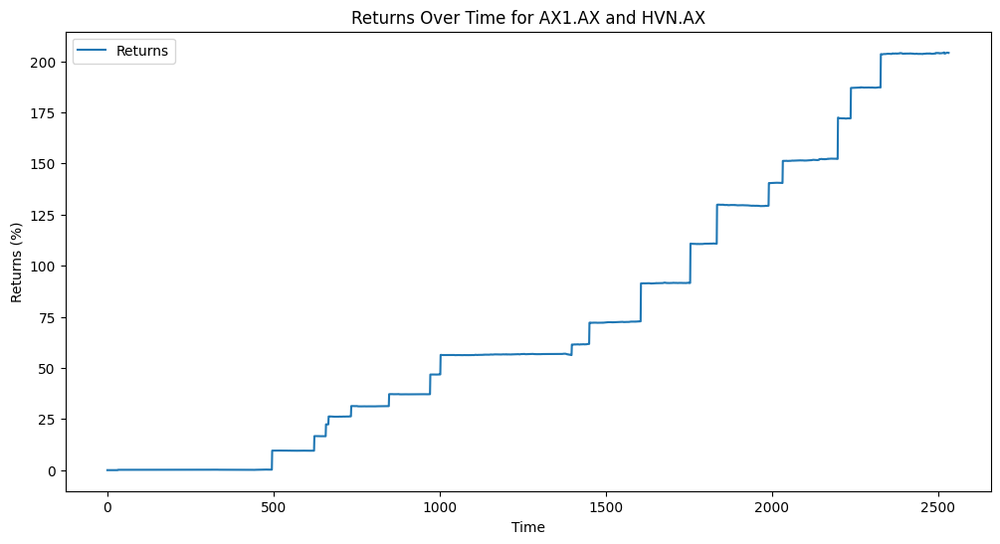

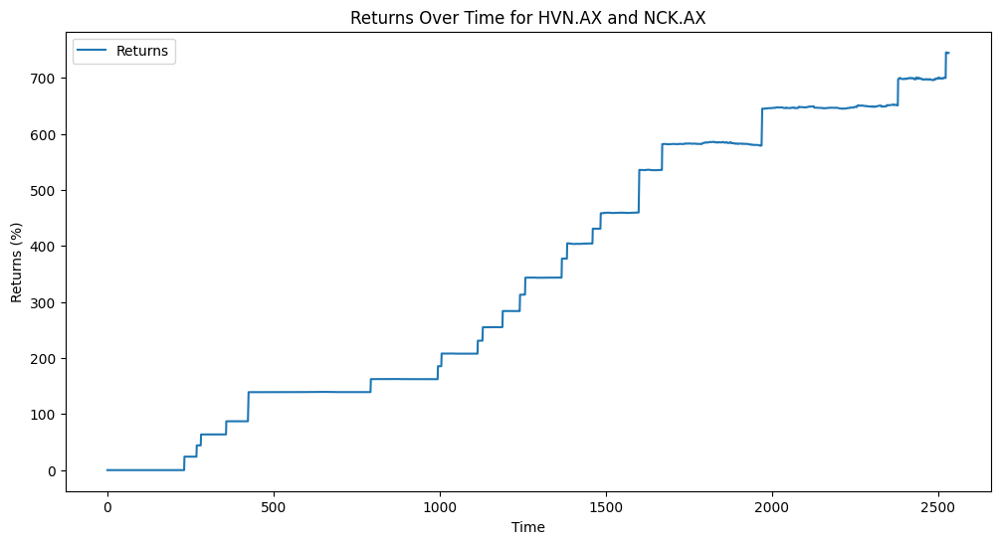

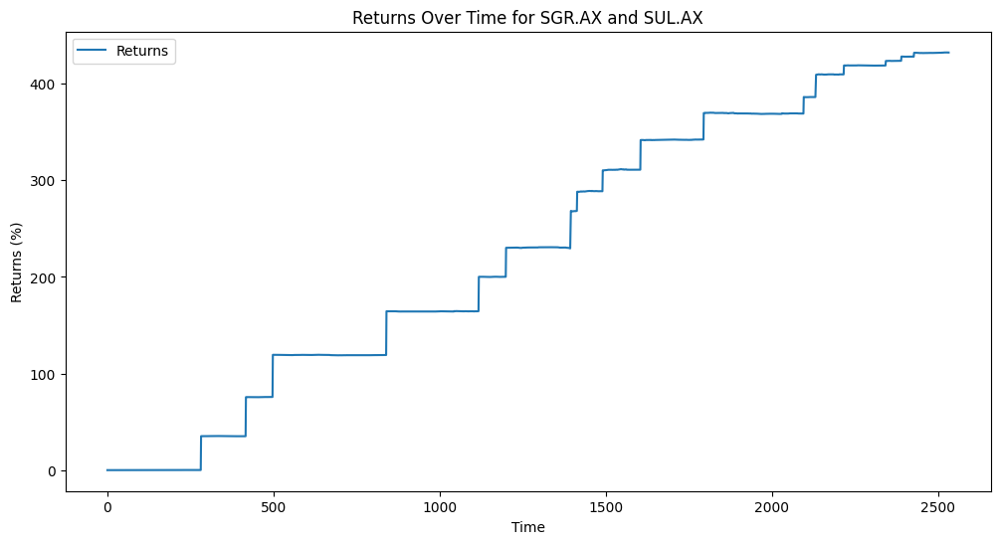

In [235]:
# Plot the returns over time for each pair
for pair, result in consumer_results.items():
  returns_over_time = result['returns_over_time']
  plt.figure(figsize=(12, 6))
  plt.plot(returns_over_time, label='Returns')
  plt.title(f'Returns Over Time for {pair[0]} and {pair[1]}')
  plt.xlabel('Time')
  plt.ylabel('Returns (%)')
  plt.legend()
  plt.show()


In [236]:
performance_metrics(consumer_results)

,Stock 1,Stock 2,Total % Return,Annualized % Return,Sharpe Ratio,Number of Trades
0,ARB.AX,HVN.AX,4045.676466,44.853619,0.229074,94
1,AX1.AX,BRG.AX,256.272433,13.473652,1.299039,85
2,AX1.AX,HVN.AX,204.089594,11.699767,1.125087,90
3,HVN.AX,NCK.AX,744.531534,23.647695,0.618144,125
4,SGR.AX,SUL.AX,432.240750,18.096807,0.792657,87
